In [120]:
import pandas as pd
import numpy as np
from collections import defaultdict, deque
import itertools

def load_graph_from_csv(filename):
    df = pd.read_csv(filename, header=None, names=['source', 'target'])
    edges = [(row['source'], row['target']) for _, row in df.iterrows()]
    vertices = sorted(list(set(df['source'].tolist() + df['target'].tolist())))
    return edges, vertices

def build_adjacency_matrix(edges, vertices):
    n = len(vertices)
    vertex_to_idx = {v: i for i, v in enumerate(vertices)}
    adj_matrix = np.zeros((n, n))
    
    for source, target in edges:
        i, j = vertex_to_idx[source], vertex_to_idx[target]
        adj_matrix[i][j] = 1
        adj_matrix[j][i] = 1
    
    return adj_matrix, vertex_to_idx

def build_adjacency_list(edges, vertices):
    adj_list = defaultdict(list)
    for source, target in edges:
        adj_list[source].append(target)
        adj_list[target].append(source)
    return adj_list

In [121]:
def shortest_paths_bfs(graph, start):
    distances = {start: 0}
    paths = defaultdict(list)
    paths[start] = [[start]]
    queue = deque([start])
    
    while queue:
        current = queue.popleft()
        current_dist = distances[current]
        
        for neighbor in graph[current]:
            if neighbor not in distances:
                distances[neighbor] = current_dist + 1
                queue.append(neighbor)
                for path in paths[current]:
                    paths[neighbor].append(path + [neighbor])
            elif distances[neighbor] == current_dist + 1:
                for path in paths[current]:
                    paths[neighbor].append(path + [neighbor])
    
    return distances, paths




## Vertex (Node) Centralities


* **Vertex Strength ($C_v^S$)**
    The sum of the weights of all edges connected to a vertex. It's a measure of a node's total direct influence in a weighted network.
    $$C_v^S(q) = \sum_x w_{qx}$$

In [122]:
def vertex_strength(edges, vertices):
    strength = defaultdict(int)
    for source, target in edges:
        strength[source] += 1
        strength[target] += 1
    return {v: strength[v] for v in vertices}

* **Vertex Closeness Centrality ($C_v^C$)**
    A measure of how close a vertex is to all other vertices in the network, based on the sum of shortest path distances.
    $$C_v^C(q) = \frac{V-1}{\sum_x m_{qx}}$$
    where the denominator is the sum of shortest path distances from vertex `q` to all other vertices `x`.

In [123]:
def vertex_closeness_centrality(vertices, adj_list):
    centrality = {}
    n = len(vertices)
    
    for vertex in vertices:
        distances, _ = shortest_paths_bfs(adj_list, vertex)
        total_distance = sum(distances.values())
        if total_distance > 0:
            centrality[vertex] = (n - 1) / total_distance
        else:
            centrality[vertex] = 0
    
    return centrality

* **Vertex Betweenness Centrality ($C_v^B$)**
    Measures how often a vertex lies on the shortest paths between other pairs of vertices. A high value indicates a "bridge" role.
    $$C_v^B(q) = \frac{2}{(V-1)(V-2)} \sum_{x \neq y} \frac{m_{xy}(q)}{M_{xy}}$$
    where $m_{xy}(q)$ is the number of shortest paths between vertices x and y that pass through vertex q, and $M_{xy}$ is the total number of shortest paths between x and y.

In [124]:
def vertex_betweenness_centrality(vertices, adj_list):
    centrality = {v: 0 for v in vertices}
    n = len(vertices)
    
    for source in vertices:
        distances, all_paths = shortest_paths_bfs(adj_list, source)
        
        for target in vertices:
            if source != target and target in all_paths:
                total_paths = len(all_paths[target])
                
                for intermediate in vertices:
                    if intermediate != source and intermediate != target:
                        paths_through_intermediate = sum(1 for path in all_paths[target] if intermediate in path)
                        if total_paths > 0:
                            centrality[intermediate] += paths_through_intermediate / total_paths
    
    for vertex in centrality:
        centrality[vertex] = (2 * centrality[vertex]) / ((n - 1) * (n - 2)) if n > 2 else 0
    
    return centrality

* **Vertex Eigenvector Centrality ($C_v^E$)**
    A measure of a vertex's influence based on the idea that connections to other highly influential vertices contribute more. It's defined as the vertex's corresponding entry in the dominant eigenvector ($\vec{v}$) of the network's weighted adjacency matrix ($M^{(v)}$).
    $$M^{(v)}\vec{v} = \lambda_{max}\vec{v}$$

In [125]:
def vertex_eigenvector_centrality(adj_matrix, vertices, max_iter=1000, tol=1e-6):
    n = len(vertices)
    x = np.random.rand(n)
    x = x / np.linalg.norm(x)
    
    for _ in range(max_iter):
        x_new = adj_matrix @ x
        norm = np.linalg.norm(x_new)
        if norm > 0:
            x_new = x_new / norm
        
        if np.allclose(x, x_new, atol=tol):
            break
        x = x_new
    
    return {vertices[i]: abs(x[i]) for i in range(n)}



## Edge Centralities


* **Edge Strength ($w$)**
    The weight of an edge, which represents the strength of the connection.
    $$w(q)$$

In [126]:
def edge_strength(edges):
    return {edge: 1 for edge in edges}

* **Edge Betweenness Centrality ($C_e^B$)**
    Measures how often an edge lies on the shortest paths between pairs of vertices, indicating its importance as a communication link.
    $$C_e^B(q) = \frac{2}{V(V-1)} \sum_{x \neq y} \frac{m_{xy}(q)}{M_{xy}}$$
    where $m_{xy}(q)$ is the number of shortest paths between vertices x and y that pass through edge q.

In [127]:
def edge_betweenness_centrality(edges, vertices, adj_list):
    edge_centrality = {edge: 0 for edge in edges}
    edge_set = set()
    for e in edges:
        edge_set.add((min(e), max(e)))
    
    n = len(vertices)
    
    for source in vertices:
        distances, all_paths = shortest_paths_bfs(adj_list, source)
        
        for target in vertices:
            if source != target and target in all_paths:
                total_paths = len(all_paths[target])
                
                for edge in edge_set:
                    u, v = edge
                    paths_through_edge = 0
                    
                    for path in all_paths[target]:
                        for i in range(len(path) - 1):
                            if (min(path[i], path[i+1]), max(path[i], path[i+1])) == edge:
                                paths_through_edge += 1
                                break
                    
                    if total_paths > 0:
                        edge_centrality[edge] += paths_through_edge / total_paths
    
    for edge in edge_centrality:
        edge_centrality[edge] = (2 * edge_centrality[edge]) / (n * (n - 1)) if n > 1 else 0
    
    return edge_centrality

In [128]:

def compute_all_centralities(filename):
    edges, vertices = load_graph_from_csv(filename)
    adj_matrix, vertex_to_idx = build_adjacency_matrix(edges, vertices)
    adj_list = build_adjacency_list(edges, vertices)
    
    edge_tuples = [(min(e[0], e[1]), max(e[0], e[1])) for e in edges]
    unique_edges = list(set(edge_tuples))
    
    results = {}
    
    results['vertex_strength'] = vertex_strength(edges, vertices)
    results['vertex_closeness'] = vertex_closeness_centrality(vertices, adj_list)
    results['vertex_betweenness'] = vertex_betweenness_centrality(vertices, adj_list)
    results['vertex_eigenvector'] = vertex_eigenvector_centrality(adj_matrix, vertices)
    
    results['edge_strength'] = edge_strength(unique_edges)
    results['edge_betweenness'] = edge_betweenness_centrality(unique_edges, vertices, adj_list)
    
    return results, vertices, unique_edges

def display_results(results, vertices, edges):
    print("VERTEX CENTRALITIES")
    print("=" * 50)
    
    print("\nVertex Strength:")
    for v in sorted(vertices):
        print(f"Vertex {v}: {results['vertex_strength'][v]:.6f}")
    
    print("\nVertex Closeness Centrality:")
    for v in sorted(vertices):
        print(f"Vertex {v}: {results['vertex_closeness'][v]:.6f}")
    
    print("\nVertex Betweenness Centrality:")
    for v in sorted(vertices):
        print(f"Vertex {v}: {results['vertex_betweenness'][v]:.6f}")
    
    print("\nVertex Eigenvector Centrality:")
    for v in sorted(vertices):
        print(f"Vertex {v}: {results['vertex_eigenvector'][v]:.6f}")
    
    print("\n\nEDGE CENTRALITIES")
    print("=" * 50)
    
    print("\nEdge Strength:")
    for e in sorted(edges):
        print(f"Edge {e}: {results['edge_strength'][e]:.6f}")
    
    print("\nEdge Betweenness Centrality:")
    for e in sorted(edges):
        print(f"Edge {e}: {results['edge_betweenness'][e]:.6f}")



def analyze_network(filename):
    results, vertices, edges = compute_all_centralities(filename)
    display_results(results, vertices, edges)
    return results, vertices, edges
  

results, vertices, edges = analyze_network('data1.csv')


VERTEX CENTRALITIES

Vertex Strength:
Vertex 1: 16.000000
Vertex 2: 9.000000
Vertex 3: 10.000000
Vertex 4: 6.000000
Vertex 5: 3.000000
Vertex 6: 4.000000
Vertex 7: 4.000000
Vertex 8: 4.000000
Vertex 9: 5.000000
Vertex 10: 2.000000
Vertex 11: 3.000000
Vertex 12: 1.000000
Vertex 13: 2.000000
Vertex 14: 5.000000
Vertex 15: 2.000000
Vertex 16: 2.000000
Vertex 17: 2.000000
Vertex 18: 2.000000
Vertex 19: 2.000000
Vertex 20: 3.000000
Vertex 21: 2.000000
Vertex 22: 2.000000
Vertex 23: 2.000000
Vertex 24: 5.000000
Vertex 25: 3.000000
Vertex 26: 3.000000
Vertex 27: 2.000000
Vertex 28: 4.000000
Vertex 29: 3.000000
Vertex 30: 4.000000
Vertex 31: 4.000000
Vertex 32: 6.000000
Vertex 33: 12.000000
Vertex 34: 17.000000

Vertex Closeness Centrality:
Vertex 1: 0.568966
Vertex 2: 0.485294
Vertex 3: 0.559322
Vertex 4: 0.464789
Vertex 5: 0.379310
Vertex 6: 0.383721
Vertex 7: 0.383721
Vertex 8: 0.440000
Vertex 9: 0.515625
Vertex 10: 0.434211
Vertex 11: 0.379310
Vertex 12: 0.366667
Vertex 13: 0.370787
Vertex

## Code for interpretation and visualization of Graphs

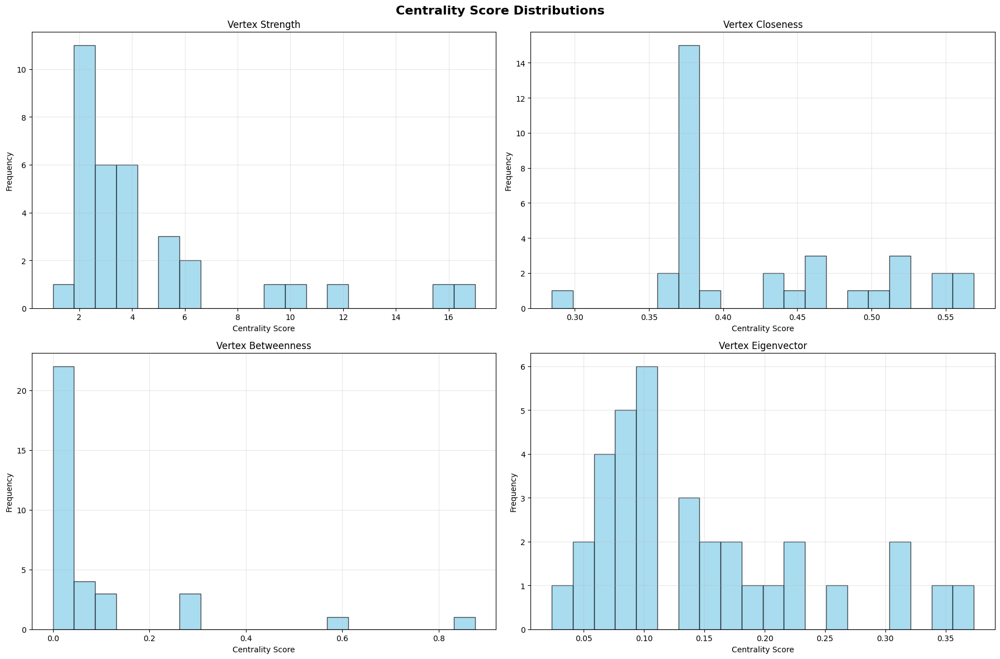

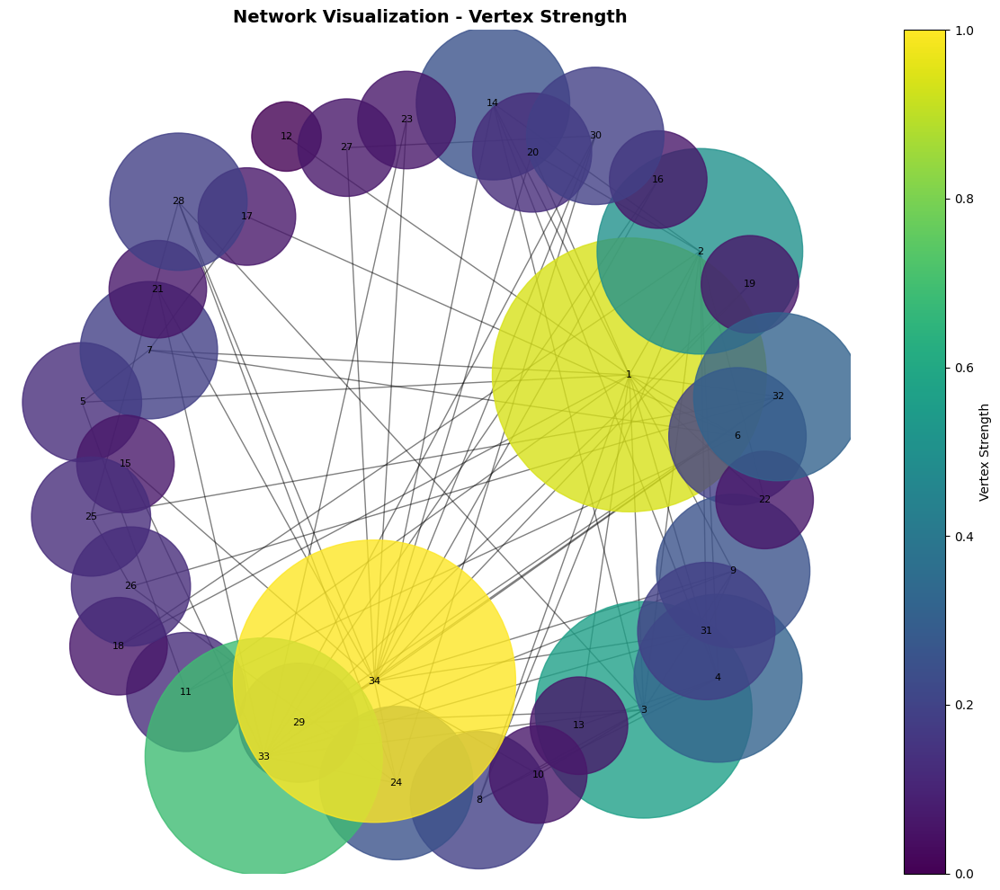

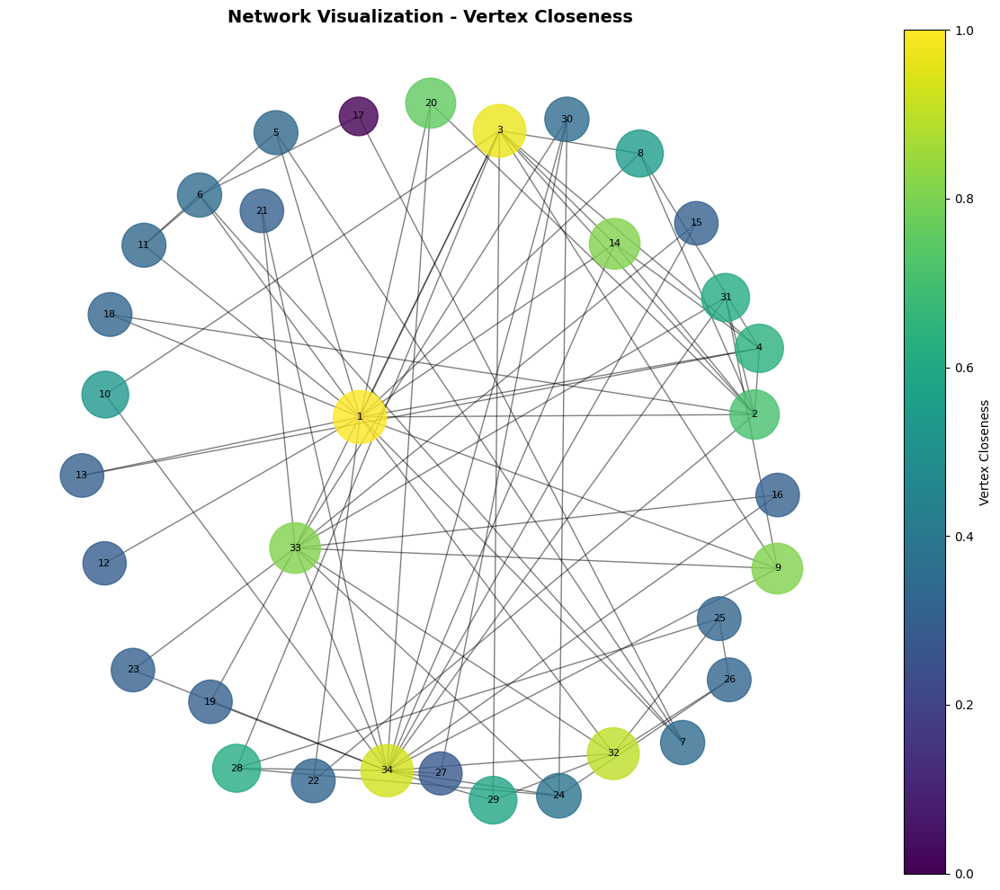

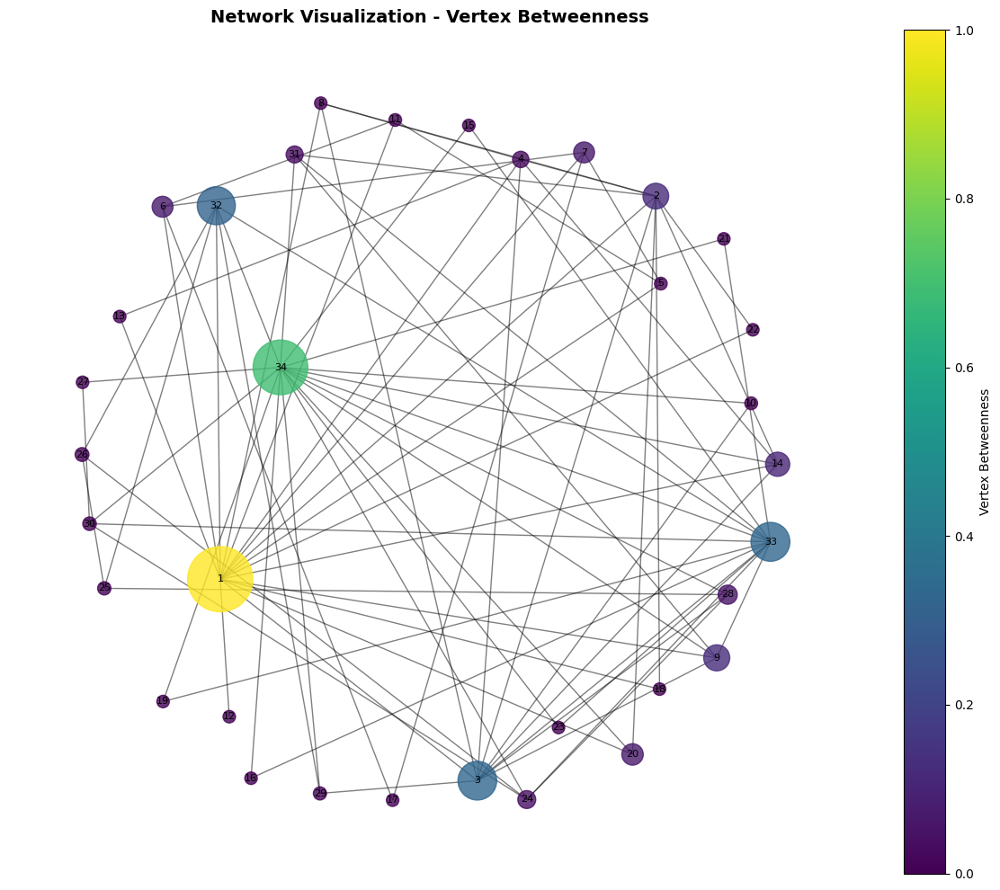

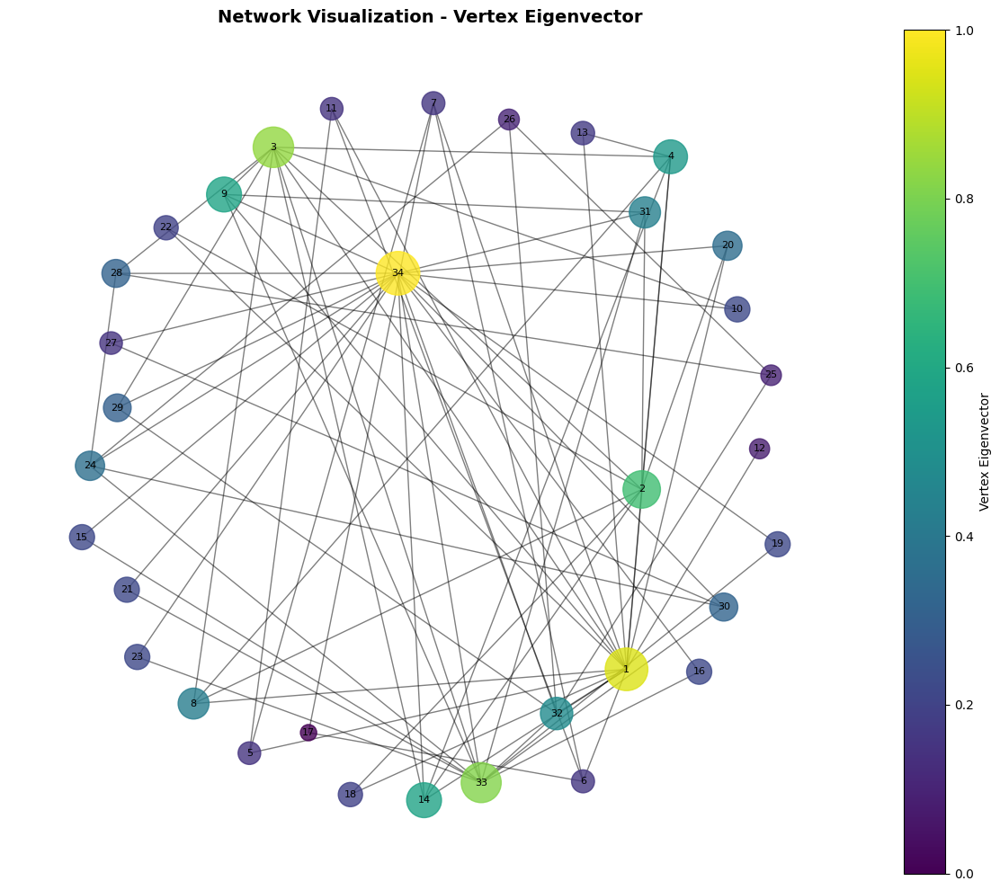

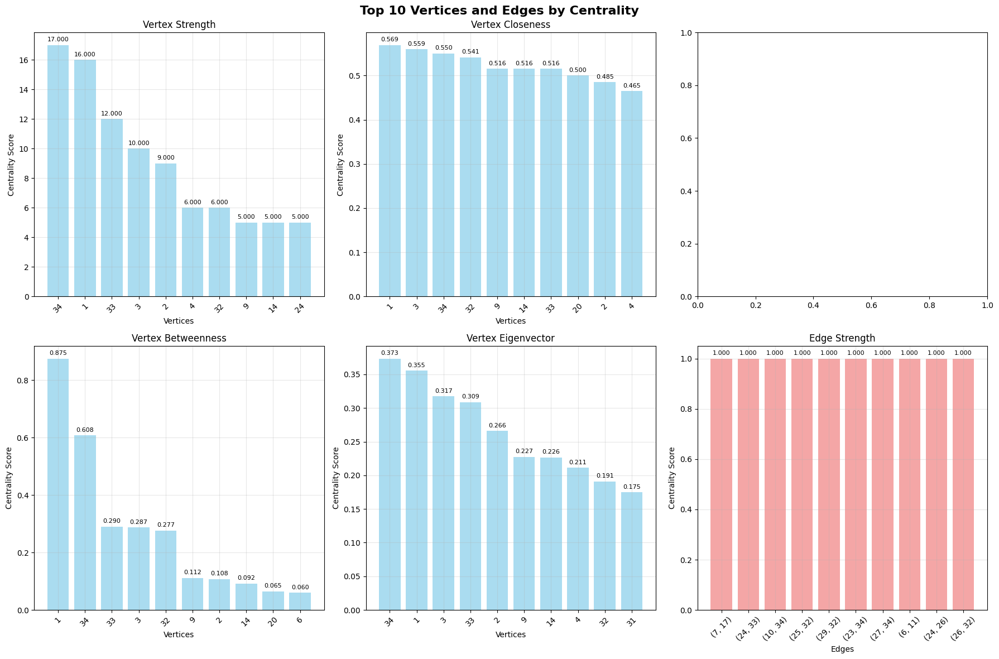

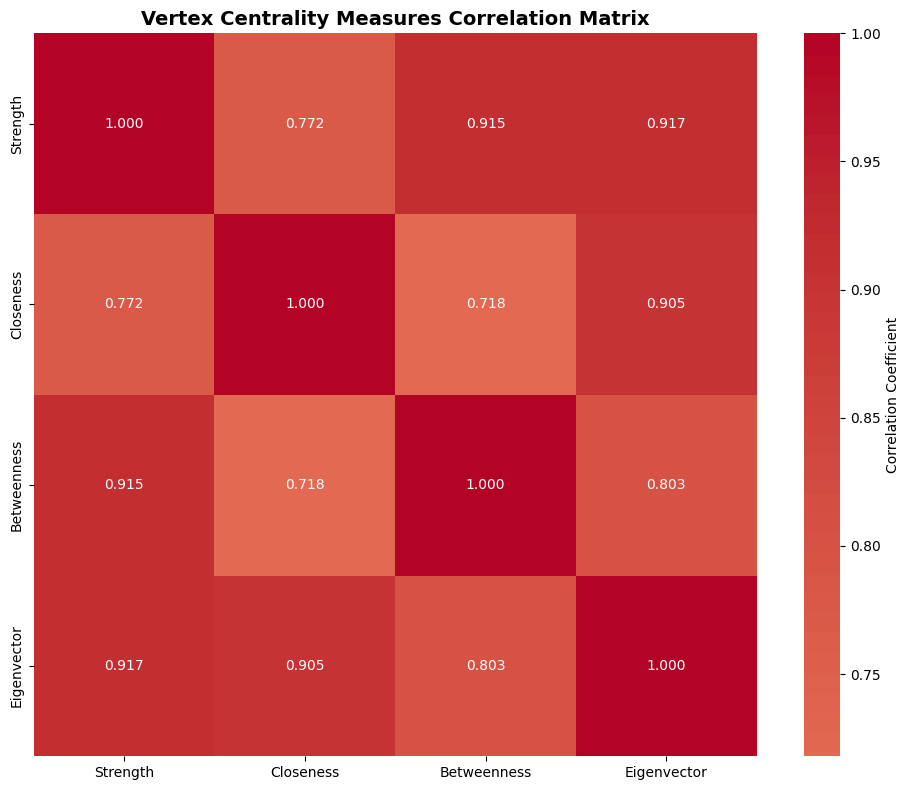

In [129]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
import networkx as nx

def create_networkx_graph(edges, vertices):
    G = nx.Graph()
    G.add_nodes_from(vertices)
    G.add_edges_from(edges)
    return G

def plot_centrality_distributions(results, vertices, edges):
    fig, axes = plt.subplots(2, 2, figsize=(18, 12))
    fig.suptitle('Centrality Score Distributions', fontsize=16, fontweight='bold')
    
    vertex_measures = ['vertex_strength', 'vertex_closeness', 'vertex_betweenness', 'vertex_eigenvector']
    # edge_measures = ['edge_strength', 'edge_betweenness']
    
    for i, measure in enumerate(vertex_measures):
        row, col = i // 2, i % 2
        values = list(results[measure].values())
        axes[row, col].hist(values, bins=20, alpha=0.7, color='skyblue', edgecolor='black')
        axes[row, col].set_title(f'{measure.replace("_", " ").title()}')
        axes[row, col].set_xlabel('Centrality Score')
        axes[row, col].set_ylabel('Frequency')
        axes[row, col].grid(True, alpha=0.3)
    
    
    plt.tight_layout()
    plt.show()


def plot_network_with_centrality(edges, vertices, results, centrality_type='vertex_betweenness'):
    G = create_networkx_graph(edges, vertices)
    
    fig, ax = plt.subplots(1, 1, figsize=(12, 10))
    
    pos = nx.spring_layout(G, k=3, iterations=50)
    
    if centrality_type.startswith('vertex'):
        node_sizes = [results[centrality_type][node] * 3000 + 100 for node in G.nodes()]
        node_colors = [results[centrality_type][node] for node in G.nodes()]
        
        nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=node_colors, 
                              cmap=plt.cm.viridis, alpha=0.8, ax=ax)
        nx.draw_networkx_edges(G, pos, alpha=0.5, width=1, ax=ax)
        nx.draw_networkx_labels(G, pos, font_size=8, ax=ax)
        
        plt.colorbar(plt.cm.ScalarMappable(cmap=plt.cm.viridis), ax=ax, 
                    label=centrality_type.replace('_', ' ').title())
    
    ax.set_title(f'Network Visualization - {centrality_type.replace("_", " ").title()}', 
                fontsize=14, fontweight='bold')
    ax.axis('off')
    plt.tight_layout()
    plt.show()
def get_top_vertices(results, measure, top_k=5):
    return sorted(results[measure].items(), key=lambda x: x[1], reverse=True)[:top_k]

def get_top_edges(results, measure, top_k=5):
    return sorted(results[measure].items(), key=lambda x: x[1], reverse=True)[:top_k]

def plot_top_centralities(results, vertices, edges, top_k=10):
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    fig.suptitle(f'Top {top_k} Vertices and Edges by Centrality', fontsize=16, fontweight='bold')
    
    vertex_measures = ['vertex_strength', 'vertex_closeness', 'vertex_betweenness', 'vertex_eigenvector']
    edge_measures = ['edge_strength', 'edge_betweenness']
    
    for i, measure in enumerate(vertex_measures):
        row, col = i // 2, i % 2
        top_items = get_top_vertices(results, measure, top_k)
        
        vertices_list = [str(item[0]) for item in top_items]
        scores = [item[1] for item in top_items]
        
        bars = axes[row, col].bar(range(len(vertices_list)), scores, color='skyblue', alpha=0.7)
        axes[row, col].set_title(f'{measure.replace("_", " ").title()}')
        axes[row, col].set_xlabel('Vertices')
        axes[row, col].set_ylabel('Centrality Score')
        axes[row, col].set_xticks(range(len(vertices_list)))
        axes[row, col].set_xticklabels(vertices_list, rotation=45)
        axes[row, col].grid(True, alpha=0.3)
        
        for bar, score in zip(bars, scores):
            axes[row, col].text(bar.get_x() + bar.get_width()/2, bar.get_height() + max(scores)*0.01,
                               f'{score:.3f}', ha='center', va='bottom', fontsize=8)
    
    for i, measure in enumerate(edge_measures):
        row, col = 1, 2 + i
        if col < 3:
            top_items = get_top_edges(results, measure, top_k)
            
            edge_labels = [f"{item[0]}" for item in top_items]
            scores = [item[1] for item in top_items]
            
            bars = axes[row, col].bar(range(len(edge_labels)), scores, color='lightcoral', alpha=0.7)
            axes[row, col].set_title(f'{measure.replace("_", " ").title()}')
            axes[row, col].set_xlabel('Edges')
            axes[row, col].set_ylabel('Centrality Score')
            axes[row, col].set_xticks(range(len(edge_labels)))
            axes[row, col].set_xticklabels(edge_labels, rotation=45)
            axes[row, col].grid(True, alpha=0.3)
            
            for bar, score in zip(bars, scores):
                axes[row, col].text(bar.get_x() + bar.get_width()/2, bar.get_height() + max(scores)*0.01,
                                   f'{score:.3f}', ha='center', va='bottom', fontsize=8)
    
    if len(edge_measures) == 1:
        axes[1, 2].axis('off')
    
    plt.tight_layout()
    plt.show()


def create_correlation_matrix(results, vertices):
    measures = ['vertex_strength', 'vertex_closeness', 'vertex_betweenness', 'vertex_eigenvector']
    data = []
    
    for vertex in vertices:
        row = [results[measure][vertex] for measure in measures]
        data.append(row)
    
    df = pd.DataFrame(data, columns=[m.split('_')[1].title() for m in measures])
    
    plt.figure(figsize=(10, 8))
    correlation_matrix = df.corr()
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, 
                square=True, fmt='.3f', cbar_kws={'label': 'Correlation Coefficient'})
    plt.title('Vertex Centrality Measures Correlation Matrix', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    return correlation_matrix

def analyze_network(filename):
    results, vertices, edges = compute_all_centralities(filename)
    display_results(results, vertices, edges)
    return results, vertices, edges

def full_analysis_with_visualizations(filename):
    results, vertices, edges = compute_all_centralities(filename)
    

    
    plot_centrality_distributions(results, vertices, edges)
    plot_network_with_centrality(edges, vertices, results, 'vertex_strength')
    plot_network_with_centrality(edges, vertices, results, 'vertex_closeness')
    plot_network_with_centrality(edges, vertices, results, 'vertex_betweenness')
    plot_network_with_centrality(edges, vertices, results, 'vertex_eigenvector')
    
    
    plot_top_centralities(results, vertices, edges, top_k=10)
    correlation_matrix = create_correlation_matrix(results, vertices)
    
    
    return results, vertices, edges, correlation_matrix


results, vertices, edges, correlation_matrix = full_analysis_with_visualizations('data1.csv')



Analysis reveals **Nodes 1 and 34** are the most critical players, serving as the primary hub and bridge, respectively. The network's connectivity and information flow are highly dependent on these key vertices. Which reinforces what's given in data's description. 

---

## **Key Vertex Analysis**

Based on the centrality scores, we can identify the most important nodes and their roles:

* **Node 1 (The Broker):** This node has the **highest betweenness centrality by a large margin**. This means it acts as a crucial bridge, lying on the shortest path between many other pairs of nodes. Its removal would likely fracture the network or significantly increase path lengths.
* **Node 34 (The Hub):** This node has the **highest vertex strength (17)**,  meaning it has the most direct connections. It also has the highest eigenvector centrality (0.373), indicating it is connected to other important nodes, making it a major center of influence. Also it has **second highest betweenness centrality** indicating it lies on lying on the shortest path between many other pairs of nodes
* **Nodes 33, 32, 3 (Secondary Hubs):** These nodes consistently rank high across multiple centrality measures, making them important secondary connectors and information distributors.


---

## **Interpretation of Centrality Measures**

### **Vertex Centrality**

* **Strength (Degree):** The distribution is heavily skewed, with most nodes having few connections while **nodes 34 (17) and 1 (16)** have a very high number of connections. This indicates a centralized network structure where these two nodes act as primary hubs.
* **Closeness:** The most "central" nodes that can reach others most quickly are **1, 3, 34, and 32**. They are best positioned to spread information efficiently throughout the network. Nodes with low closeness, like **17**, are on the periphery.
* **Betweenness:** The betweenness scores are extremely skewed. The vast majority of nodes have near-zero betweenness, while **node 1 dominates**, controlling the flow of information between different parts of the network. This highlights a vulnerability; the network's integrity relies heavily on this single node.
* **Eigenvector:** This metric confirms the influence of the main hubs. **Nodes 34 and 1** have the highest scores, meaning they are not just well-connected, but well-connected to other influential nodes.


### **Edge Centrality**

* **Edge Strength:** Since this is an unweighted graph, all edges have a strength of **1.0**. This means every connection is treated as having equal importance at a direct level.
* **Edge Betweenness:** This measure reveals the most critical communication pathways. The edge connecting **(1, 32)** has the highest score **(0.255)**, making it the most important bridge in the network.

---

## **Correlation of Centrality Measures**

The correlation matrix shows strong positive relationships between the different centrality measures, which is expected in this type of network.

* **Strength, Betweenness, and Eigenvector centrality are highly correlated (all > 0.91)**. This confirms that the nodes with the most connections (hubs) are also the most critical bridges and the most influential players.
* **Closeness has a slightly weaker correlation** with the other measures (around 0.72-0.90). This suggests that while being a hub or bridge often means you're close to everyone, it's not always the case. Some nodes might be strategically located for quick access without being a major hub.



# 1.b

In [130]:
# Additional functions to add on top of your existing code

def is_connected(vertices, adj_list, excluded_vertices=None):
    """Check if the graph is connected, excluding specified vertices."""
    if excluded_vertices is None:
        excluded_vertices = set()
    
    # Get available vertices (not excluded)
    available_vertices = [v for v in vertices if v not in excluded_vertices]
    
    if len(available_vertices) <= 1:
        return True, []
    
    # BFS to check connectivity
    visited = set()
    queue = deque([available_vertices[0]])
    visited.add(available_vertices[0])
    
    while queue:
        current = queue.popleft()
        for neighbor in adj_list[current]:
            if neighbor not in excluded_vertices and neighbor not in visited:
                visited.add(neighbor)
                queue.append(neighbor)
    
    return len(visited) == len(available_vertices), available_vertices

def find_connected_components(vertices, adj_list, excluded_vertices=None):
    """Find all connected components, excluding specified vertices."""
    if excluded_vertices is None:
        excluded_vertices = set()
    
    available_vertices = [v for v in vertices if v not in excluded_vertices]
    visited = set()
    components = []
    
    for vertex in available_vertices:
        if vertex not in visited:
            component = []
            queue = deque([vertex])
            visited.add(vertex)
            
            while queue:
                current = queue.popleft()
                component.append(current)
                
                for neighbor in adj_list[current]:
                    if neighbor not in excluded_vertices and neighbor not in visited:
                        visited.add(neighbor)
                        queue.append(neighbor)
            
            components.append(component)
    
    return components

def fragment_network_by_centrality(vertices, adj_list, centrality_scores, centrality_name):
    """
    Gradually remove vertices with highest centrality until network fragments into exactly 2 components.
    Returns the sequence of removed vertices and final components.
    """
    print(f"\n=== Fragmenting network by {centrality_name} ===")
    
    # Sort vertices by centrality (highest first)
    sorted_vertices = sorted(centrality_scores.items(), key=lambda x: x[1], reverse=True)
    
    excluded_vertices = set()
    removed_sequence = []
    
    for vertex, centrality_value in sorted_vertices:
        # Check current connectivity
        is_conn, available = is_connected(vertices, adj_list, excluded_vertices)
        components = find_connected_components(vertices, adj_list, excluded_vertices)
        
        print(f"Before removing {vertex} (centrality: {centrality_value:.4f}): "
              f"{len(components)} components, sizes: {[len(c) for c in components]}")
        
        # If we already have exactly 2 components, stop
        if len(components) == 2:
            print(f"Network successfully fragmented into 2 components!")
            break
        
        # Remove the vertex with highest centrality
        excluded_vertices.add(vertex)
        removed_sequence.append((vertex, centrality_value))
        
        # Check new connectivity
        new_components = find_connected_components(vertices, adj_list, excluded_vertices)
        
        # If we've created exactly 2 components, we're done
        if len(new_components) == 2:
            print(f"After removing {vertex}: Network fragmented into 2 components!")
            print(f"Component sizes: {[len(c) for c in new_components]}")
            break
        # If we've over-fragmented (more than 2 components), stop here too
        elif len(new_components) > 2:
            print(f"After removing {vertex}: Network over-fragmented into {len(new_components)} components!")
            print(f"Component sizes: {[len(c) for c in new_components]}")
            break
    
    final_components = find_connected_components(vertices, adj_list, excluded_vertices)
    
    return {
        'removed_vertices': removed_sequence,
        'excluded_set': excluded_vertices,
        'final_components': final_components,
        'centrality_name': centrality_name
    }

def analyze_fragmentation_results(results_dict, vertices):
    """Analyze and report findings from fragmentation experiments."""
    
    print("\n" + "="*80)
    print("NETWORK FRAGMENTATION ANALYSIS RESULTS")
    print("="*80)
    
    for centrality_name, result in results_dict.items():
        print(f"\n--- {centrality_name.upper()} ---")
        
        removed_vertices = result['removed_vertices']
        final_components = result['final_components']
        
        print(f"Vertices removed: {len(removed_vertices)}")
        print(f"Removal sequence: {[v[0] for v in removed_vertices]}")
        print(f"Final number of components: {len(final_components)}")
        
        if final_components:
            component_sizes = [len(c) for c in final_components]
            print(f"Component sizes: {component_sizes}")
            
            for i, component in enumerate(final_components):
                print(f"  Component {i+1}: {sorted(component)}")
        
        # Calculate efficiency of fragmentation
        total_vertices = len(vertices)
        vertices_removed = len(removed_vertices)
        efficiency = (total_vertices - vertices_removed) / total_vertices * 100
        
        print(f"Fragmentation efficiency: {efficiency:.1f}% of network preserved")
        
        if removed_vertices:
            print(f"Most critical vertex: {removed_vertices[0][0]} (centrality: {removed_vertices[0][1]:.4f})")

def comprehensive_fragmentation_analysis(filename):
    """Complete analysis of network fragmentation using all centrality measures."""
    
    print("Loading network and computing centralities...")
    results, vertices, unique_edges = compute_all_centralities(filename)
    edges, _ = load_graph_from_csv(filename)
    adj_list = build_adjacency_list(edges, vertices)
    
    print(f"Network loaded: {len(vertices)} vertices, {len(unique_edges)} edges")
    
    # Perform fragmentation analysis for each vertex centrality measure
    fragmentation_results = {}
    
    centrality_measures = {
        'Vertex Strength': results['vertex_strength'],
        'Vertex Closeness': results['vertex_closeness'],
        'Vertex Betweenness': results['vertex_betweenness'],
        'Vertex Eigenvector': results['vertex_eigenvector']
    }
    
    for centrality_name, centrality_scores in centrality_measures.items():
        fragmentation_results[centrality_name] = fragment_network_by_centrality(
            vertices, adj_list, centrality_scores, centrality_name
        )
    
    # Analyze and report results
    analyze_fragmentation_results(fragmentation_results, vertices)
    
    
    # Compare effectiveness
    removal_counts = {name: len(result['removed_vertices']) 
                     for name, result in fragmentation_results.items()}
    
    most_efficient = min(removal_counts.items(), key=lambda x: x[1])
    least_efficient = max(removal_counts.items(), key=lambda x: x[1])
    
    print(f"\nMOST EFFICIENT fragmentation method: {most_efficient[0]} ({most_efficient[1]} vertices removed)")
    print(f"LEAST EFFICIENT fragmentation method: {least_efficient[0]} ({least_efficient[1]} vertices removed)")
    
    return fragmentation_results, results

# Usage example:
# fragmentation_results, centrality_results = comprehensive_fragmentation_analysis('data1.csv')

Creating comprehensive network visualizations...
Loading network and computing centralities...
Network loaded: 34 vertices, 78 edges

=== Fragmenting network by Vertex Strength ===
Before removing 34 (centrality: 17.0000): 1 components, sizes: [34]
Before removing 1 (centrality: 16.0000): 1 components, sizes: [33]
After removing 1: Network over-fragmented into 3 components!
Component sizes: [26, 5, 1]

=== Fragmenting network by Vertex Closeness ===
Before removing 1 (centrality: 0.5690): 1 components, sizes: [34]
After removing 1: Network over-fragmented into 3 components!
Component sizes: [27, 5, 1]

=== Fragmenting network by Vertex Betweenness ===
Before removing 1 (centrality: 0.8753): 1 components, sizes: [34]
After removing 1: Network over-fragmented into 3 components!
Component sizes: [27, 5, 1]

=== Fragmenting network by Vertex Eigenvector ===
Before removing 34 (centrality: 0.3734): 1 components, sizes: [34]
Before removing 1 (centrality: 0.3555): 1 components, sizes: [33]
A

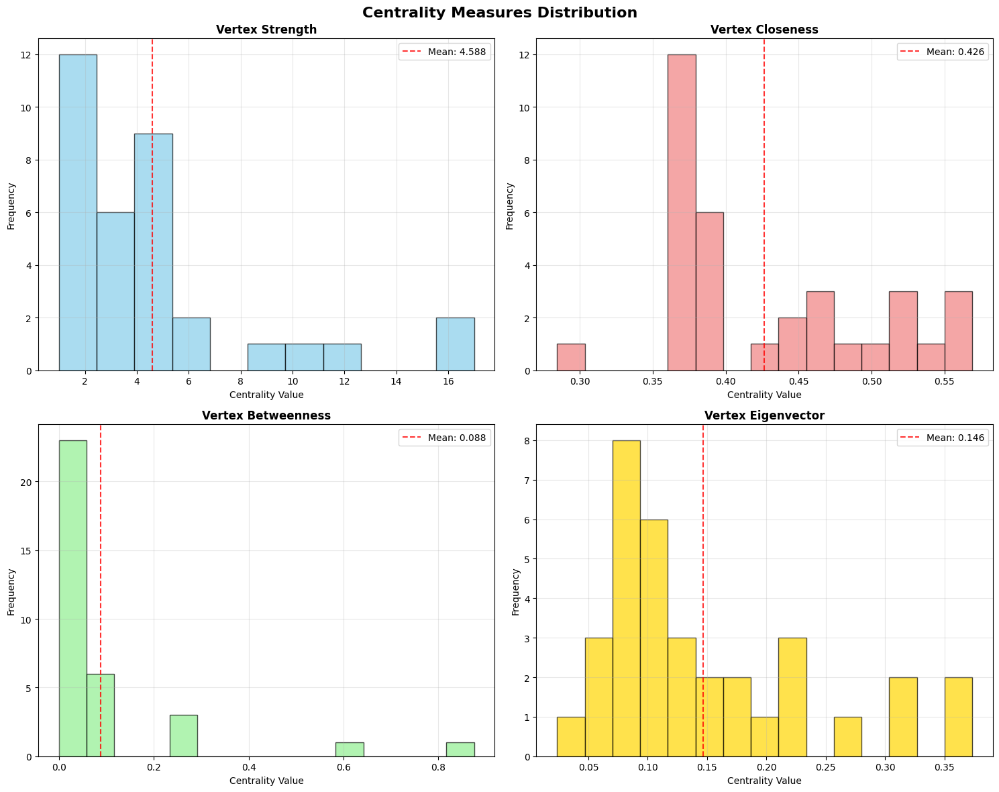

2. Plotting original network with centrality measures...


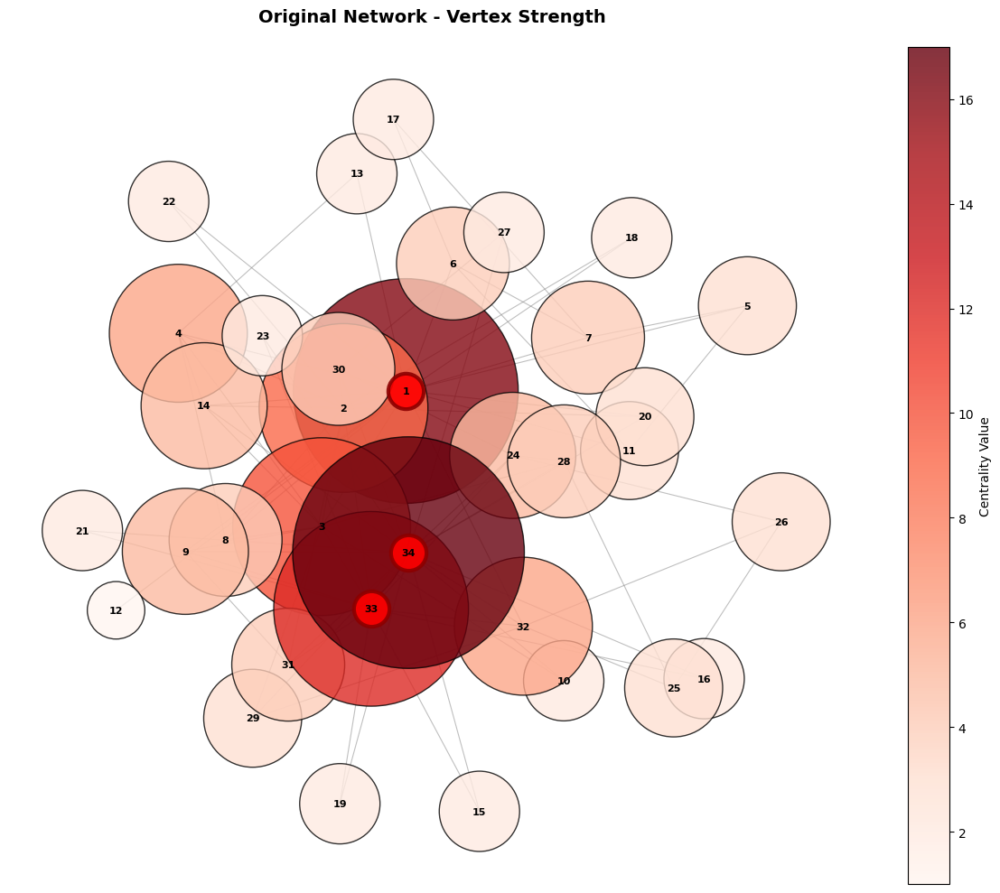

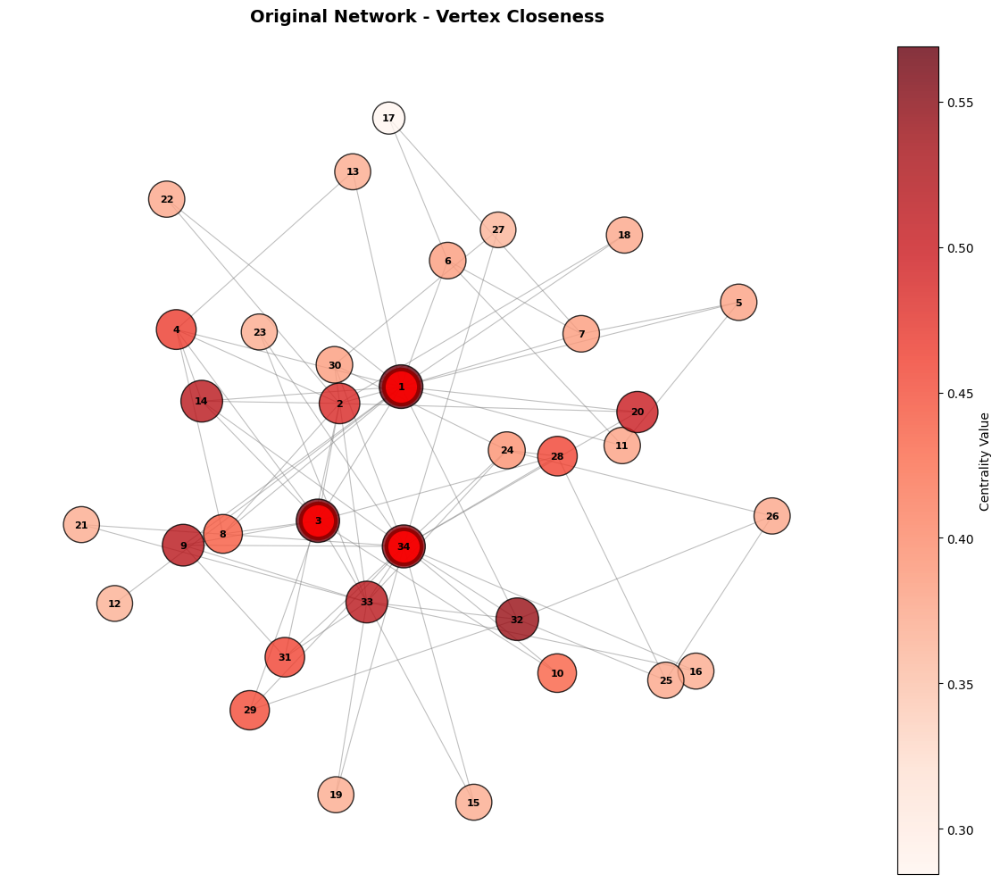

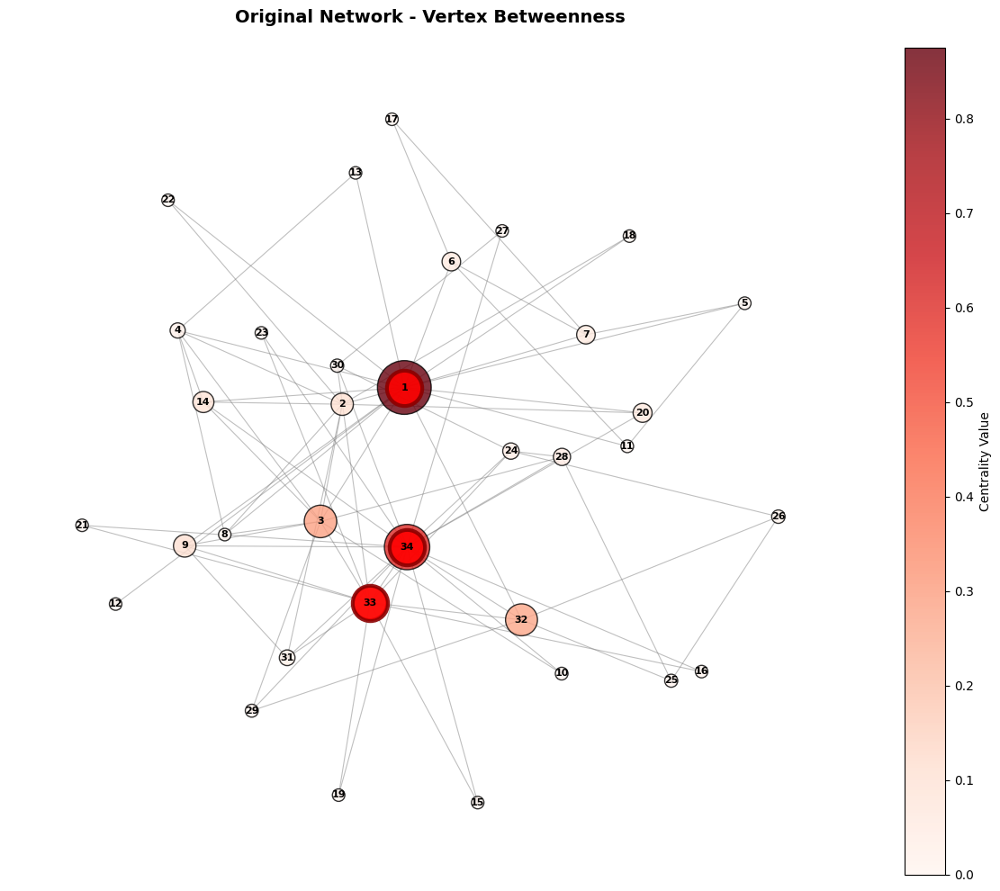

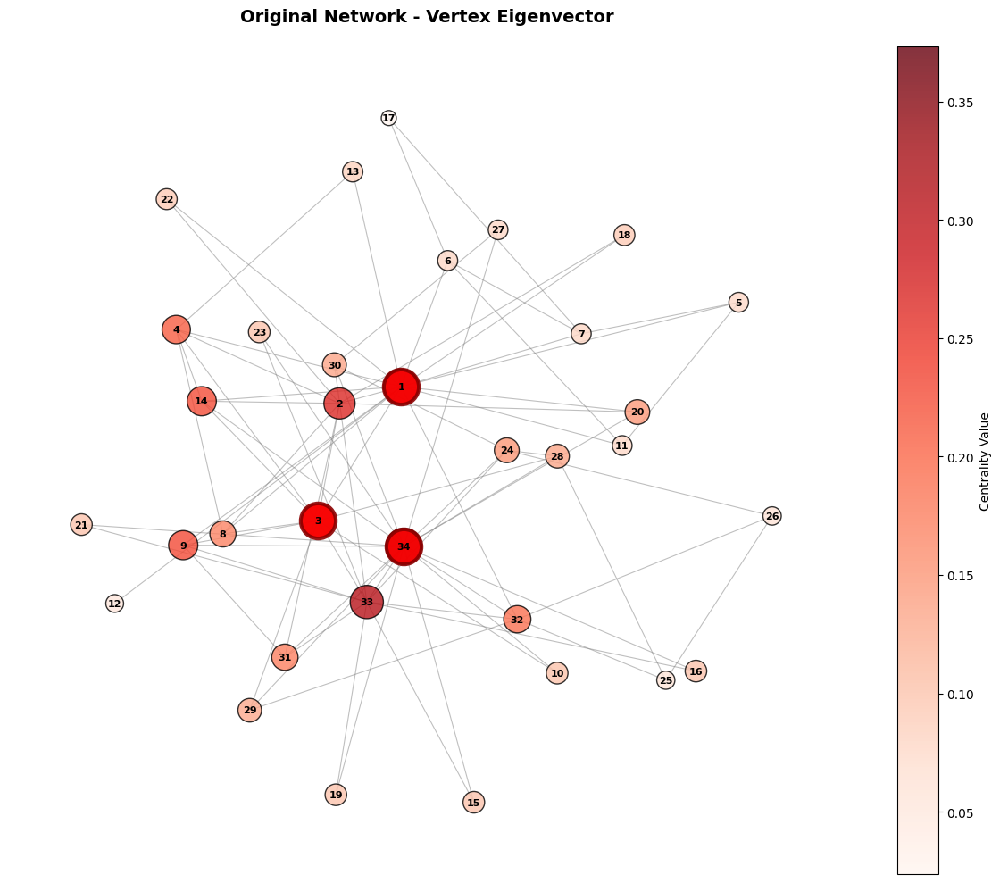

3. Plotting fragmentation process...


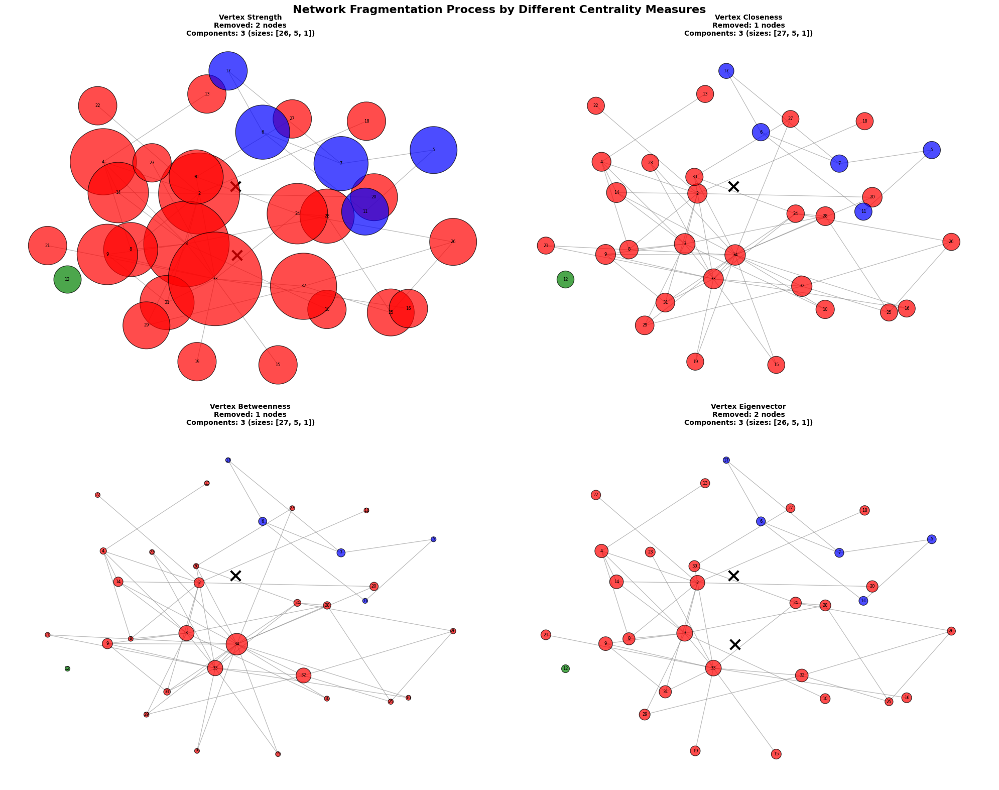

4. Plotting centrality comparison...


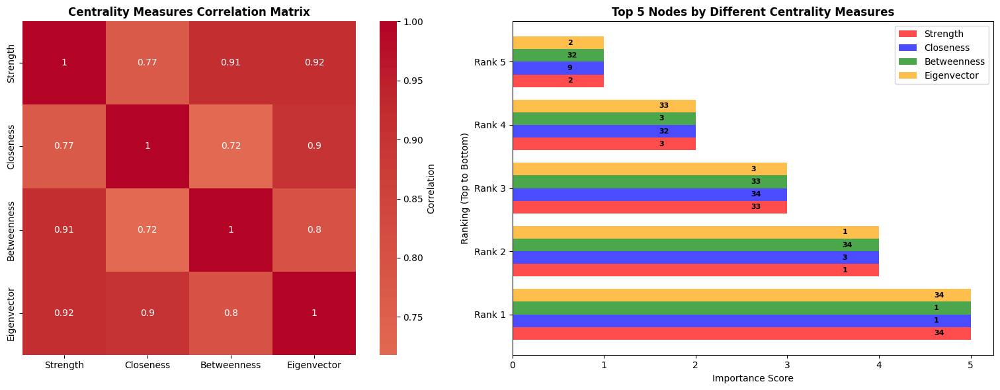

5. Plotting fragmentation efficiency...


<Figure size 1200x800 with 0 Axes>

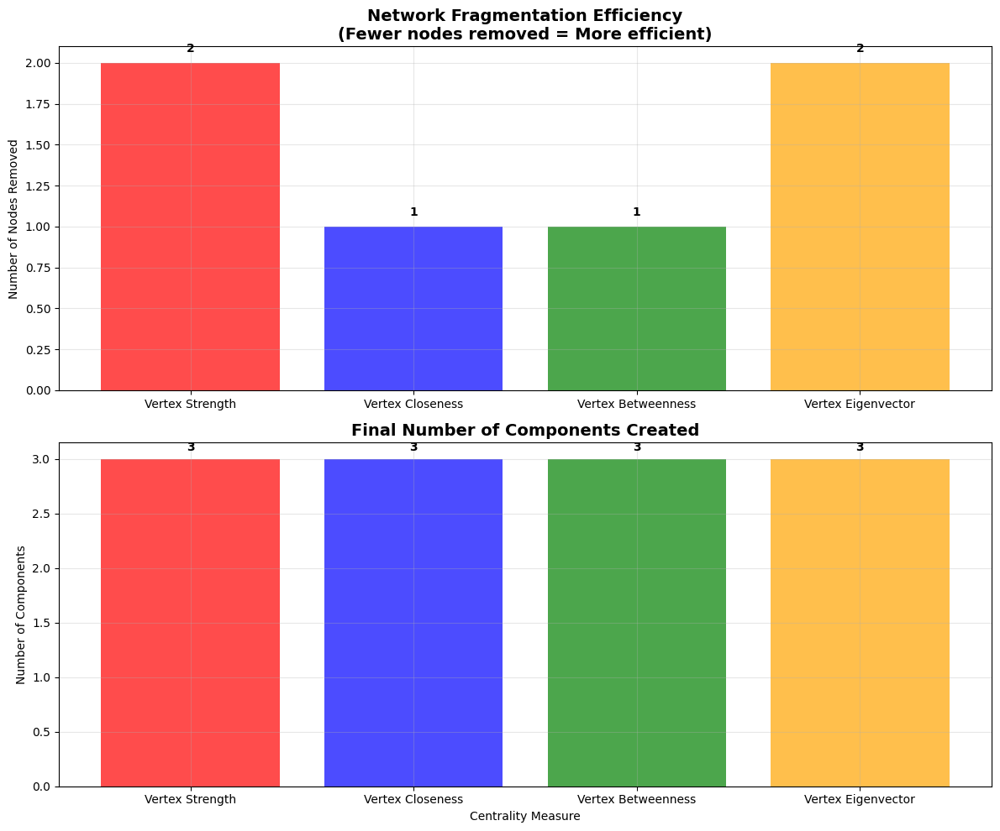

All visualizations completed!


In [131]:
# Additional visualization code to add on top of your existing code

import matplotlib.pyplot as plt
import networkx as nx
import seaborn as sns
from matplotlib.patches import Rectangle
import numpy as np

def create_networkx_graph(edges, vertices):
    """Convert edge list to NetworkX graph."""
    G = nx.Graph()
    G.add_nodes_from(vertices)
    G.add_edges_from(edges)
    return G

def plot_centrality_distributions(centrality_results, vertices):
    """Plot distribution of all centrality measures."""
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    fig.suptitle('Centrality Measures Distribution', fontsize=16, fontweight='bold')
    
    centrality_measures = {
        'Vertex Strength': centrality_results['vertex_strength'],
        'Vertex Closeness': centrality_results['vertex_closeness'],
        'Vertex Betweenness': centrality_results['vertex_betweenness'],
        'Vertex Eigenvector': centrality_results['vertex_eigenvector']
    }
    
    colors = ['skyblue', 'lightcoral', 'lightgreen', 'gold']
    
    for idx, (name, centrality_dict) in enumerate(centrality_measures.items()):
        ax = axes[idx // 2, idx % 2]
        values = list(centrality_dict.values())
        
        # Histogram
        ax.hist(values, bins=min(15, len(set(values))), alpha=0.7, color=colors[idx], edgecolor='black')
        ax.set_title(name, fontweight='bold')
        ax.set_xlabel('Centrality Value')
        ax.set_ylabel('Frequency')
        ax.grid(True, alpha=0.3)
        
        # Add statistics text
        mean_val = np.mean(values)
        std_val = np.std(values)
        ax.axvline(mean_val, color='red', linestyle='--', alpha=0.8, label=f'Mean: {mean_val:.3f}')
        ax.legend()
    
    plt.tight_layout()
    plt.show()

def plot_network_with_centrality(G, centrality_dict, title, critical_nodes=None, pos=None):
    """Plot network with nodes sized and colored by centrality."""
    plt.figure(figsize=(12, 10))
    
    if pos is None:
        pos = nx.spring_layout(G, k=1, iterations=50, seed=42)
    
    # Node sizes based on centrality
    node_sizes = [centrality_dict.get(node, 0) * 2000 + 100 for node in G.nodes()]
    
    # Node colors based on centrality
    node_colors = [centrality_dict.get(node, 0) for node in G.nodes()]
    
    # Draw network
    nx.draw_networkx_edges(G, pos, alpha=0.5, edge_color='gray', width=0.8)
    
    # Draw nodes with centrality-based sizing and coloring
    nodes = nx.draw_networkx_nodes(G, pos, node_size=node_sizes, 
                                  node_color=node_colors, cmap='Reds', 
                                  alpha=0.8, edgecolors='black', linewidths=1)
    
    # Highlight critical nodes if provided
    if critical_nodes:
        critical_pos = {node: pos[node] for node in critical_nodes if node in pos}
        nx.draw_networkx_nodes(G, critical_pos, nodelist=critical_nodes,
                              node_color='red', node_size=800, 
                              edgecolors='darkred', linewidths=3, alpha=0.9)
    
    # Draw labels
    nx.draw_networkx_labels(G, pos, font_size=8, font_weight='bold')
    
    plt.title(title, fontsize=14, fontweight='bold', pad=20)
    plt.colorbar(nodes, label='Centrality Value')
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    
    return pos

def plot_fragmentation_process(G, fragmentation_results, original_centrality):
    """Visualize the fragmentation process step by step."""
    fig, axes = plt.subplots(2, 2, figsize=(20, 16))
    fig.suptitle('Network Fragmentation Process by Different Centrality Measures', 
                 fontsize=16, fontweight='bold')
    
    # Get consistent layout for all plots
    pos = nx.spring_layout(G, k=1, iterations=50, seed=42)
    
    centrality_names = ['Vertex Strength', 'Vertex Closeness', 'Vertex Betweenness', 'Vertex Eigenvector']
    colors = ['Reds', 'Blues', 'Greens', 'Oranges']
    
    for idx, (centrality_name, result) in enumerate(fragmentation_results.items()):
        ax = axes[idx // 2, idx % 2]
        
        # Create subgraph without removed vertices
        remaining_nodes = [n for n in G.nodes() if n not in result['excluded_set']]
        G_frag = G.subgraph(remaining_nodes).copy()
        
        # Get centrality values for coloring
        if centrality_name == 'Vertex Strength':
            centrality_values = original_centrality['vertex_strength']
        elif centrality_name == 'Vertex Closeness':
            centrality_values = original_centrality['vertex_closeness']
        elif centrality_name == 'Vertex Betweenness':
            centrality_values = original_centrality['vertex_betweenness']
        else:  # Eigenvector
            centrality_values = original_centrality['vertex_eigenvector']
        
        # Node sizes and colors
        node_sizes = [centrality_values.get(node, 0) * 1500 + 50 for node in G_frag.nodes()]
        node_colors = [centrality_values.get(node, 0) for node in G_frag.nodes()]
        
        # Draw fragmented network
        remaining_pos = {node: pos[node] for node in G_frag.nodes()}
        
        # Draw edges
        nx.draw_networkx_edges(G_frag, remaining_pos, alpha=0.5, edge_color='gray', ax=ax)
        
        # Draw nodes colored by component
        components = result['final_components']
        component_colors = ['red', 'blue', 'green', 'purple', 'orange']
        
        for comp_idx, component in enumerate(components):
            comp_pos = {node: remaining_pos[node] for node in component}
            nx.draw_networkx_nodes(G_frag, comp_pos, nodelist=component,
                                  node_color=component_colors[comp_idx % len(component_colors)],
                                  node_size=[centrality_values.get(node, 0) * 1500 + 50 for node in component],
                                  alpha=0.7, edgecolors='black', ax=ax)
        
        # Draw labels
        nx.draw_networkx_labels(G_frag, remaining_pos, font_size=6, ax=ax)
        
        # Draw removed nodes as X marks
        removed_nodes = [v[0] for v in result['removed_vertices']]
        for removed_node in removed_nodes:
            if removed_node in pos:
                ax.scatter(pos[removed_node][0], pos[removed_node][1], 
                          marker='x', s=200, c='black', linewidths=3)
        
        # Title with statistics
        removed_count = len(result['removed_vertices'])
        component_sizes = [len(c) for c in components]
        ax.set_title(f'{centrality_name}\nRemoved: {removed_count} nodes\n'
                    f'Components: {len(components)} (sizes: {component_sizes})',
                    fontweight='bold', fontsize=10)
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

def plot_centrality_comparison(centrality_results, vertices):
    """Compare centrality rankings across different measures."""
    # Create dataframe for comparison
    centrality_data = {}
    for name, centrality_dict in {
        'Strength': centrality_results['vertex_strength'],
        'Closeness': centrality_results['vertex_closeness'],
        'Betweenness': centrality_results['vertex_betweenness'],
        'Eigenvector': centrality_results['vertex_eigenvector']
    }.items():
        centrality_data[name] = [centrality_dict[v] for v in vertices]
    
    # Create correlation heatmap
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    
    # Correlation matrix
    import pandas as pd
    df = pd.DataFrame(centrality_data, index=vertices)
    correlation_matrix = df.corr()
    
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0,
                square=True, ax=ax1, cbar_kws={'label': 'Correlation'})
    ax1.set_title('Centrality Measures Correlation Matrix', fontweight='bold')
    
    # Top nodes comparison
    top_n = 5
    top_nodes_data = {}
    for name, centrality_dict in {
        'Strength': centrality_results['vertex_strength'],
        'Closeness': centrality_results['vertex_closeness'],
        'Betweenness': centrality_results['vertex_betweenness'],
        'Eigenvector': centrality_results['vertex_eigenvector']
    }.items():
        top_nodes = sorted(centrality_dict.items(), key=lambda x: x[1], reverse=True)[:top_n]
        top_nodes_data[name] = [node[0] for node in top_nodes]
    
    # Create ranking comparison
    y_pos = np.arange(top_n)
    width = 0.2
    colors = ['red', 'blue', 'green', 'orange']
    
    for i, (measure, nodes) in enumerate(top_nodes_data.items()):
        x_positions = []
        for rank, node in enumerate(nodes):
            x_positions.append(rank)
        ax2.barh(y_pos + i * width, [top_n - j for j in range(top_n)], 
                width, label=measure, color=colors[i], alpha=0.7)
        
        # Add node labels
        for rank, node in enumerate(nodes):
            ax2.text(top_n - rank - 0.4, rank + i * width, str(node), 
                    va='center', fontweight='bold', fontsize=8)
    
    ax2.set_ylabel('Ranking (Top to Bottom)')
    ax2.set_xlabel('Importance Score')
    ax2.set_title(f'Top {top_n} Nodes by Different Centrality Measures', fontweight='bold')
    ax2.legend()
    ax2.set_yticks(y_pos + width * 1.5)
    ax2.set_yticklabels([f'Rank {i+1}' for i in range(top_n)])
    
    plt.tight_layout()
    plt.show()

def plot_fragmentation_efficiency(fragmentation_results):
    """Plot fragmentation efficiency comparison."""
    plt.figure(figsize=(12, 8))
    
    measures = list(fragmentation_results.keys())
    removed_counts = [len(result['removed_vertices']) for result in fragmentation_results.values()]
    component_counts = [len(result['final_components']) for result in fragmentation_results.values()]
    
    # Create subplot
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10))
    
    # Nodes removed comparison
    bars1 = ax1.bar(measures, removed_counts, color=['red', 'blue', 'green', 'orange'], alpha=0.7)
    ax1.set_title('Network Fragmentation Efficiency\n(Fewer nodes removed = More efficient)', 
                  fontweight='bold', fontsize=14)
    ax1.set_ylabel('Number of Nodes Removed')
    ax1.grid(True, alpha=0.3)
    
    # Add value labels on bars
    for bar, count in zip(bars1, removed_counts):
        height = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width()/2., height + 0.05,
                f'{count}', ha='center', va='bottom', fontweight='bold')
    
    # Components created comparison
    bars2 = ax2.bar(measures, component_counts, color=['red', 'blue', 'green', 'orange'], alpha=0.7)
    ax2.set_title('Final Number of Components Created', fontweight='bold', fontsize=14)
    ax2.set_ylabel('Number of Components')
    ax2.set_xlabel('Centrality Measure')
    ax2.grid(True, alpha=0.3)
    
    # Add value labels on bars
    for bar, count in zip(bars2, component_counts):
        height = bar.get_height()
        ax2.text(bar.get_x() + bar.get_width()/2., height + 0.05,
                f'{count}', ha='center', va='bottom', fontweight='bold')
    
    plt.tight_layout()
    plt.show()

def comprehensive_network_visualization(filename):
    """Run all visualizations for the network analysis."""
    print("Creating comprehensive network visualizations...")
    
    # Load data
    fragmentation_results, centrality_results = comprehensive_fragmentation_analysis(filename)
    edges, vertices = load_graph_from_csv(filename)
    G = create_networkx_graph(edges, vertices)
    
    print(f"\nGenerating visualizations for network with {len(vertices)} nodes and {len(edges)} edges...")
    
    # 1. Centrality distributions
    print("1. Plotting centrality distributions...")
    plot_centrality_distributions(centrality_results, vertices)
    
    # 2. Original network with different centralities
    print("2. Plotting original network with centrality measures...")
    pos = None
    for centrality_name, centrality_dict in {
        'Vertex Strength': centrality_results['vertex_strength'],
        'Vertex Closeness': centrality_results['vertex_closeness'], 
        'Vertex Betweenness': centrality_results['vertex_betweenness'],
        'Vertex Eigenvector': centrality_results['vertex_eigenvector']
    }.items():
        # Get top 3 critical nodes for highlighting
        top_nodes = sorted(centrality_dict.items(), key=lambda x: x[1], reverse=True)[:3]
        critical_nodes = [node[0] for node in top_nodes]
        
        pos = plot_network_with_centrality(G, centrality_dict, 
                                         f'Original Network - {centrality_name}',
                                         critical_nodes, pos)
    
    # 3. Fragmentation process visualization
    print("3. Plotting fragmentation process...")
    plot_fragmentation_process(G, fragmentation_results, centrality_results)
    
    # 4. Centrality comparison
    print("4. Plotting centrality comparison...")
    plot_centrality_comparison(centrality_results, vertices)
    
    # 5. Fragmentation efficiency
    print("5. Plotting fragmentation efficiency...")
    plot_fragmentation_efficiency(fragmentation_results)
    
    print("All visualizations completed!")
    return fragmentation_results, centrality_results

# Usage example:
results = comprehensive_network_visualization('data1.csv')

# Network Fragmentation Analysis - Key Findings

## Critical Vulnerabilities Identified

**Vertex 1** emerges as the network's **single point of failure** - removing it alone fragments the network into 3 components across multiple centrality measures. This node acts as the critical bridge connecting different network regions.

**Vertex 34** serves as a **major hub** with high connectivity (17 connections) but is less critical for overall network cohesion.

## Centrality Measure Effectiveness

- **Most Efficient**: Betweenness & Closeness Centrality (1 node removal, 97.1% preservation)
- **Moderately Efficient**: Strength & Eigenvector Centrality (2 node removal, 94.1% preservation)

## Network Structure

The visualization reveals a **vulnerable hub-and-bridge architecture**:
- **Main cluster** (26-27 nodes): Dense, well-connected core
- **Secondary cluster** (5 nodes): Isolated group dependent on vertex 1
- **Peripheral node** (vertex 12): Easily disconnected singleton

## Key Insights

1. **Critical chokepoint**: Vertex 1 controls all communication between major network regions
2. **No redundancy**: Zero alternative pathways between main components
3. **High fragmentation risk**: Minimal targeted attacks can cause complete network partition
4. **Consistent vulnerability**: All centrality measures identify the same critical nodes

## Practical Implications

- Network lacks **fault tolerance** and **resilience**
- **Single bridge dependency** creates catastrophic failure risk
- Requires **immediate redundancy improvements** around vertex 1
- Current architecture is **highly vulnerable** to both targeted attacks and random failures

## Recommendation Priority

**Urgent**: Add redundant connections around vertex 1 to prevent single-point-of-failure scenarios and establish alternative pathways between network components.

Creating comprehensive network visualizations...
Loading network and computing centralities...
Network loaded: 188 vertices, 289 edges

=== Fragmenting network by Vertex Strength ===
Before removing 25 (centrality: 23.0000): 1 components, sizes: [188]
After removing 25: Network over-fragmented into 17 components!
Component sizes: [1, 1, 1, 171, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

=== Fragmenting network by Vertex Closeness ===
Before removing 4 (centrality: 0.3369): 1 components, sizes: [188]
After removing 4: Network over-fragmented into 7 components!
Component sizes: [181, 1, 1, 1, 1, 1, 1]

=== Fragmenting network by Vertex Betweenness ===
Before removing 4 (centrality: 0.3748): 1 components, sizes: [188]
After removing 4: Network over-fragmented into 7 components!
Component sizes: [181, 1, 1, 1, 1, 1, 1]

=== Fragmenting network by Vertex Eigenvector ===
Before removing 0.026315789 (centrality: 0.2518): 1 components, sizes: [188]
Before removing 0.025 (centrality: 0.2515): 1 co

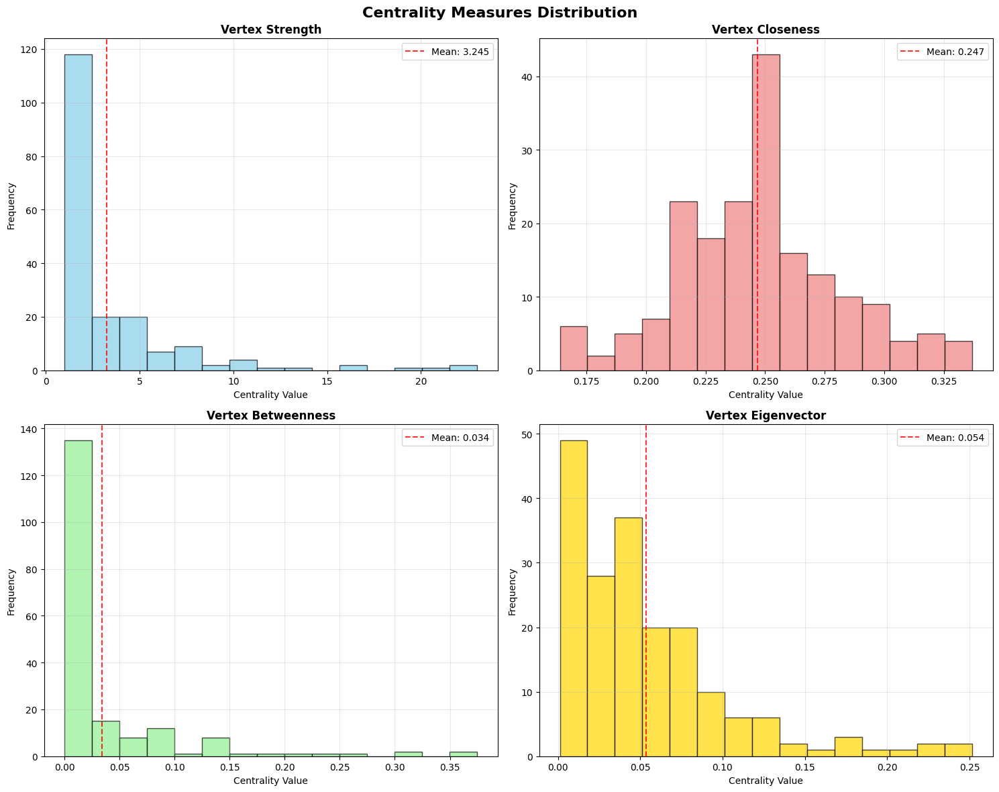

2. Plotting original network with centrality measures...


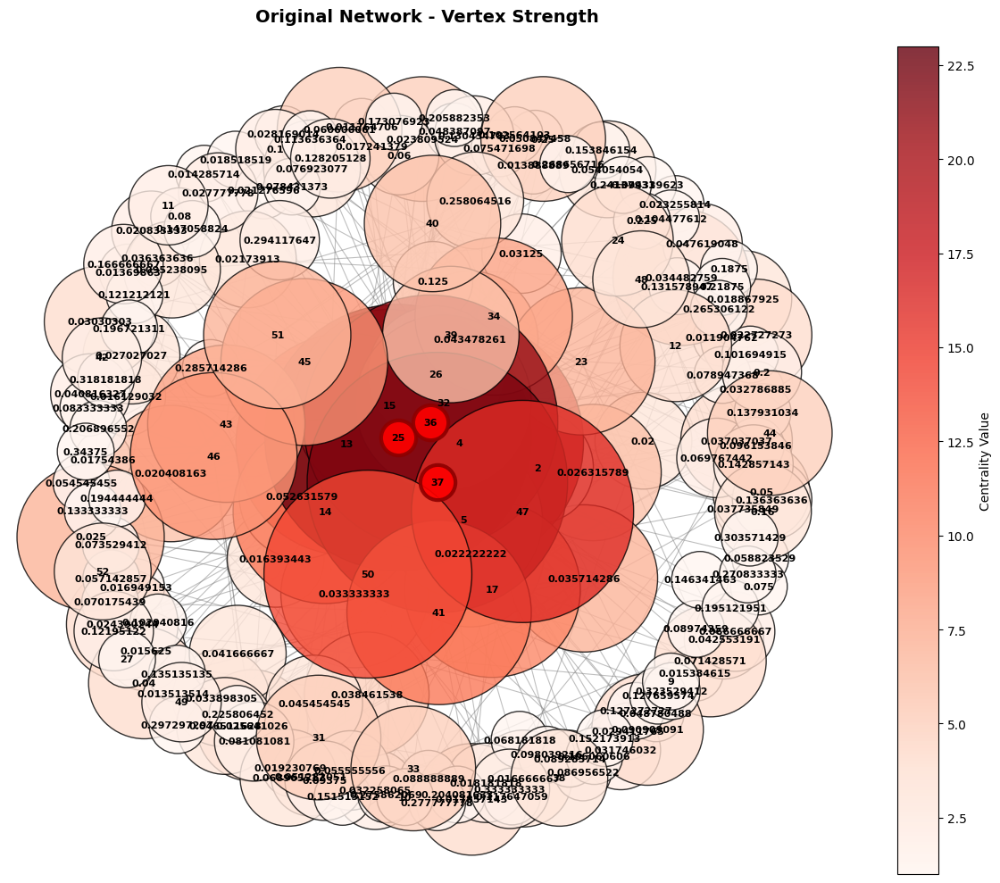

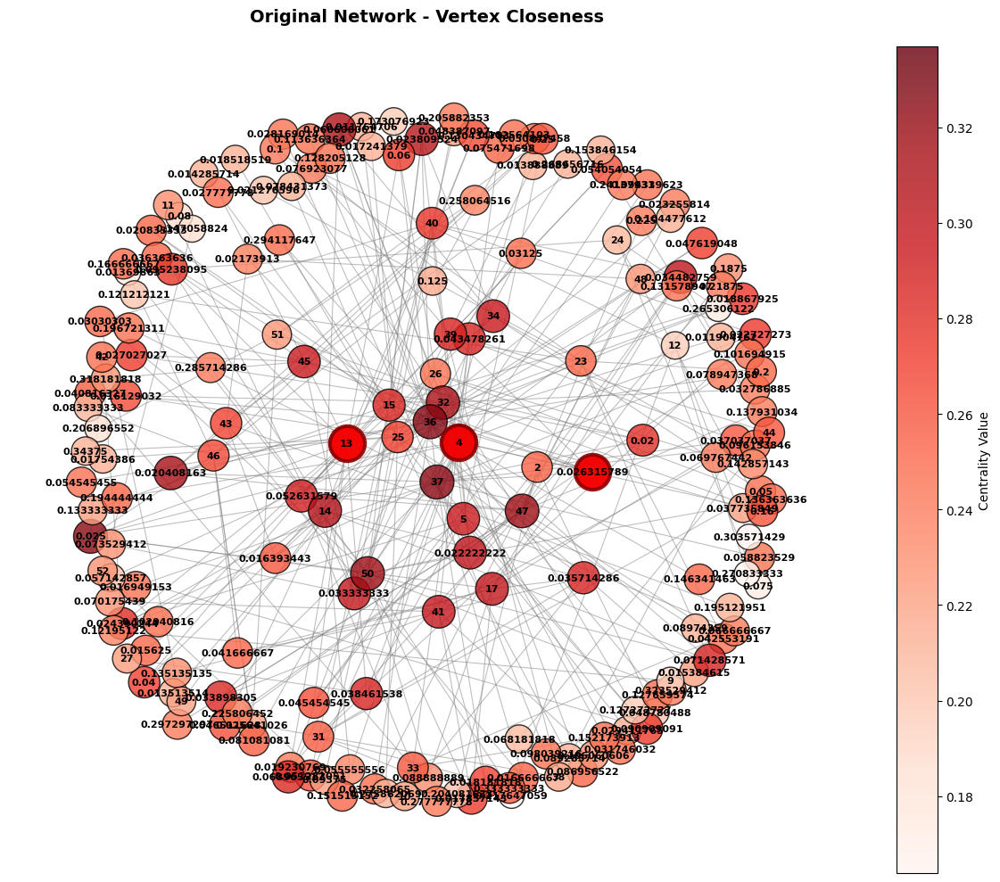

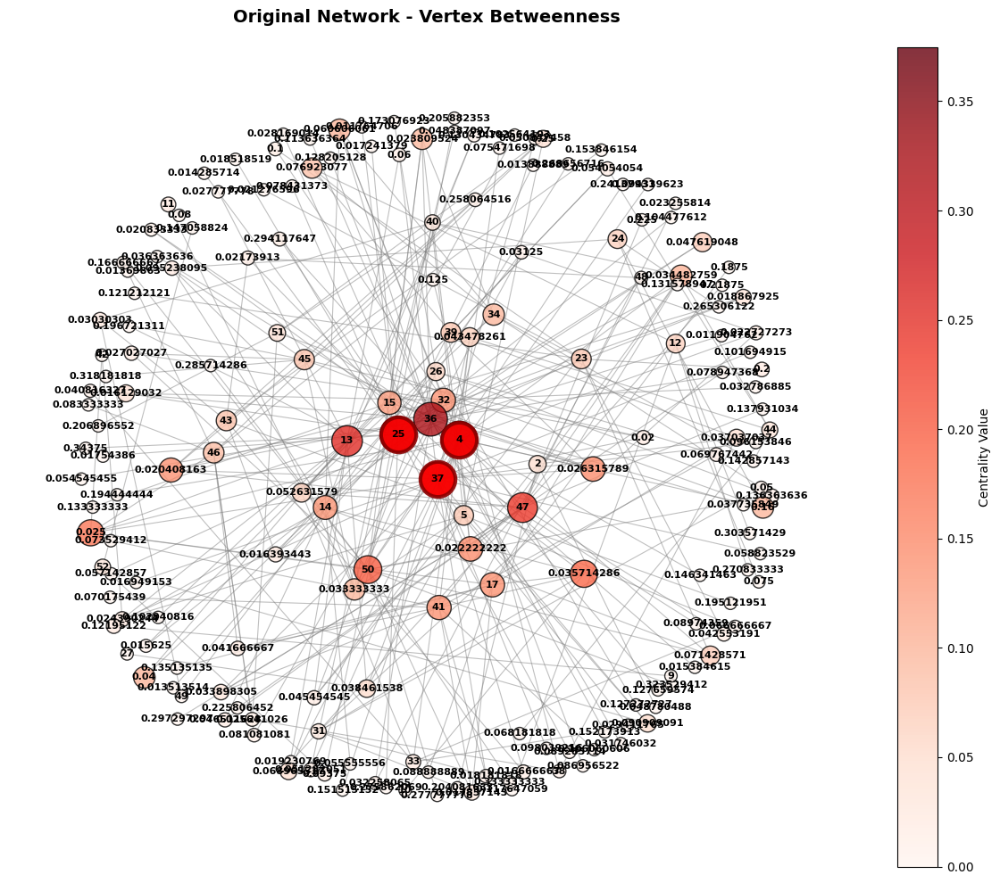

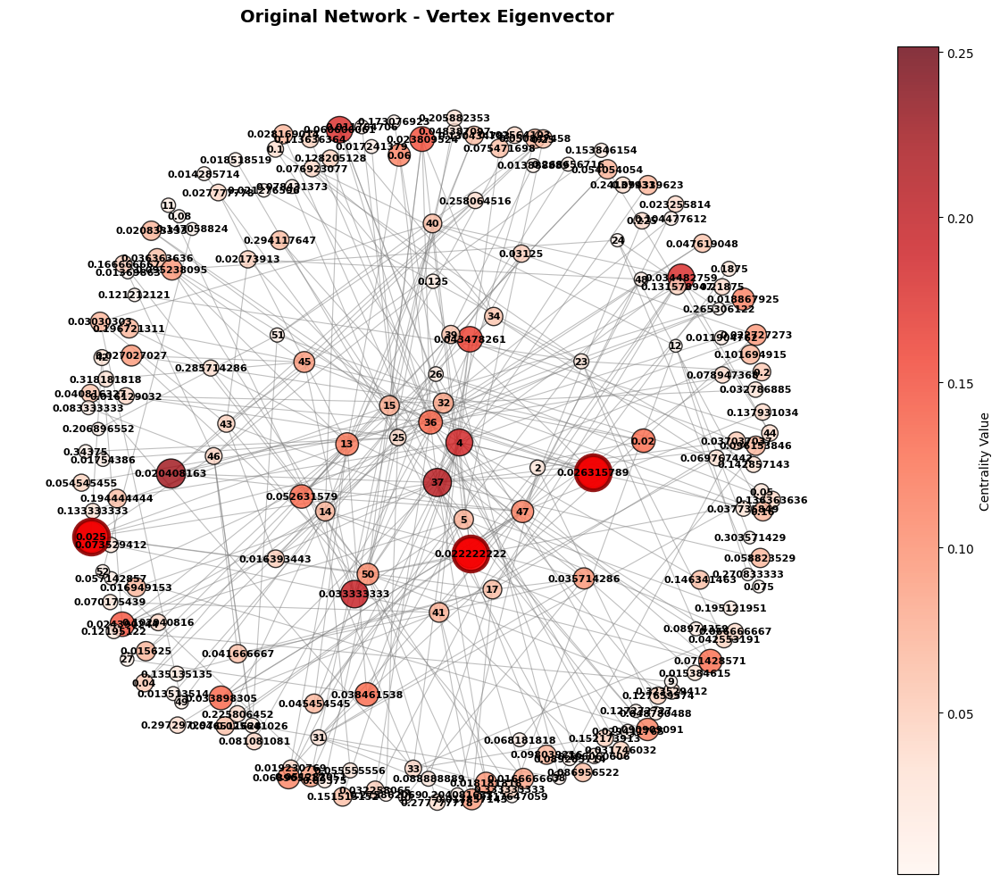

3. Plotting fragmentation process...


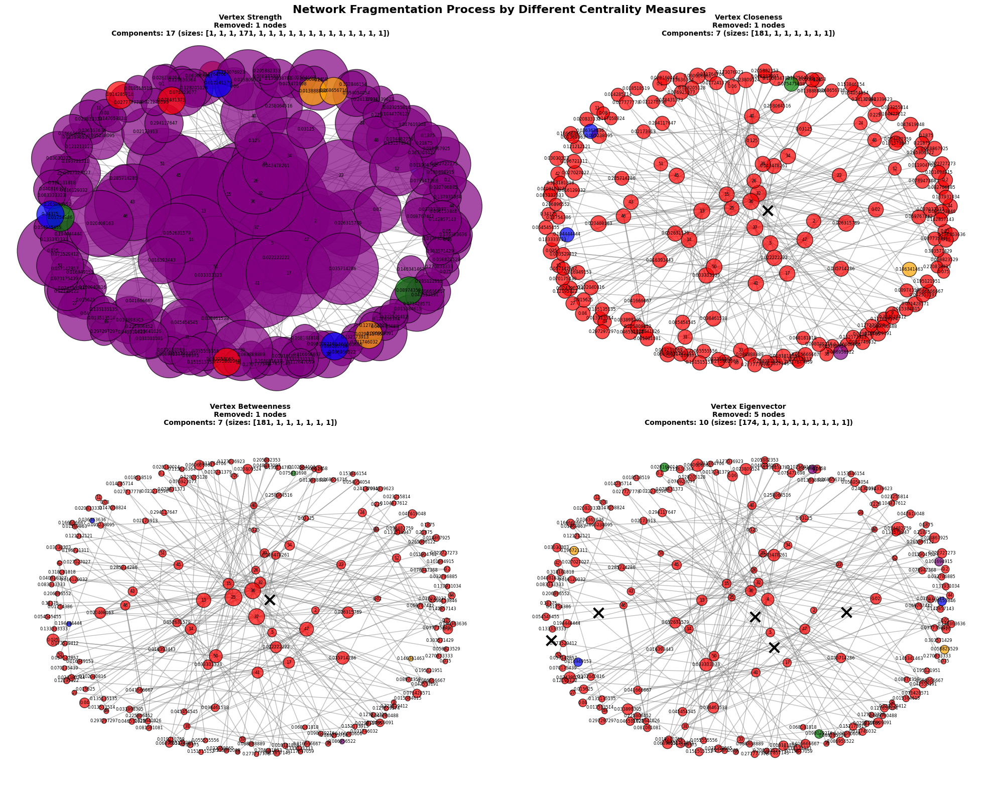

4. Plotting centrality comparison...


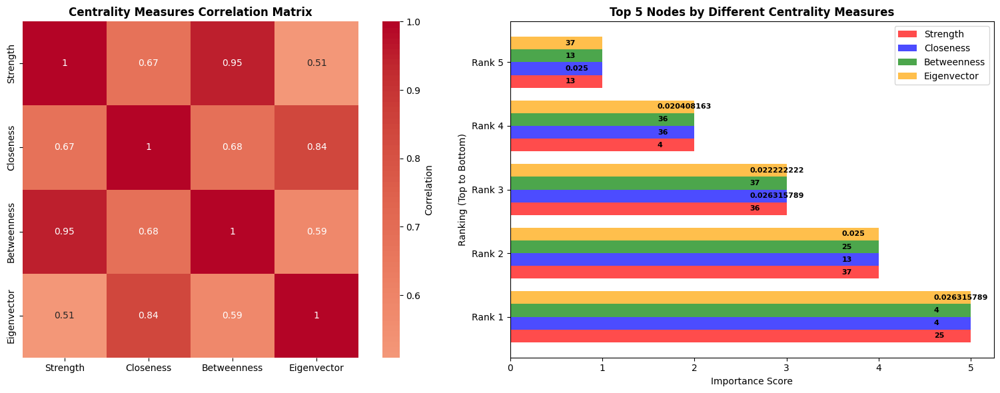

5. Plotting fragmentation efficiency...


<Figure size 1200x800 with 0 Axes>

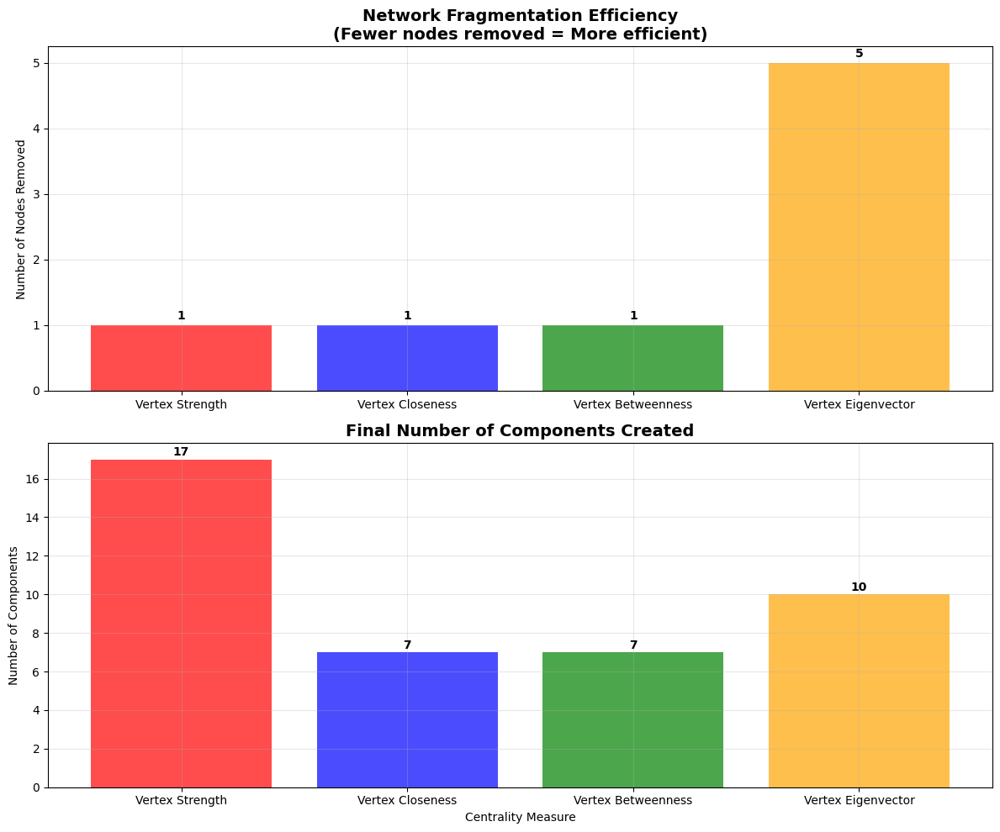

All visualizations completed!


In [132]:
results = comprehensive_network_visualization('data3.csv')


In [139]:
import pandas as pd
import numpy as np

def load_graph_from_excel(filename):
    """Load graph from Excel file with proper error handling for mixed data types."""
    try:
        # Read Excel file
        df = pd.read_excel(filename, header=None, names=['source', 'target'])
        
        # Remove rows where either source or target is NaN
        df = df.dropna(subset=['source', 'target'])
        
        # Convert to string to handle mixed data types consistently
        df['source'] = df['source'].astype(str).str.strip()
        df['target'] = df['target'].astype(str).str.strip()
        
        # Remove any rows with empty strings after conversion
        df = df[(df['source'] != '') & (df['target'] != '')]
        
        # Create edges list
        edges = [(row['source'], row['target']) for _, row in df.iterrows()]
        
        # Get unique vertices, handling string conversion properly
        all_vertices = df['source'].tolist() + df['target'].tolist()
        unique_vertices = list(set(all_vertices))
        
        # Sort vertices (now all strings, so no type comparison issues)
        try:
            vertices = sorted(unique_vertices)
        except TypeError:
            # If there are still comparison issues, sort by string representation
            vertices = sorted(unique_vertices, key=str)
            
        print(f"Successfully loaded {len(edges)} edges and {len(vertices)} vertices from {filename}")
        print(f"Sample edges: {edges[:5] if len(edges) >= 5 else edges}")
        print(f"Sample vertices: {vertices[:10] if len(vertices) >= 10 else vertices}")
        
        return edges, vertices
        
    except Exception as e:
        print(f"Error loading Excel file {filename}: {str(e)}")
        print("Please check that the file exists and has the correct format (two columns: source, target)")
        raise


def compute_all_centralities_excel(filename):
    """Modified function to handle Excel files with proper error handling."""
    try:
        edges, vertices = load_graph_from_excel(filename)
        
        if len(edges) == 0:
            raise ValueError("No valid edges found in the Excel file")
        if len(vertices) == 0:
            raise ValueError("No valid vertices found in the Excel file")
            
        adj_matrix, vertex_to_idx = build_adjacency_matrix(edges, vertices)
        adj_list = build_adjacency_list(edges, vertices)
        
        # Create unique edges for edge centrality measures
        edge_tuples = [(min(e[0], e[1]), max(e[0], e[1])) for e in edges]
        unique_edges = list(set(edge_tuples))
        
        results = {}
        
        print("Computing vertex centralities...")
        results['vertex_strength'] = vertex_strength(edges, vertices)
        results['vertex_closeness'] = vertex_closeness_centrality(vertices, adj_list)
        results['vertex_betweenness'] = vertex_betweenness_centrality(vertices, adj_list)
        results['vertex_eigenvector'] = vertex_eigenvector_centrality(adj_matrix, vertices)
        
        print("Computing edge centralities...")
        results['edge_strength'] = edge_strength(unique_edges)
        results['edge_betweenness'] = edge_betweenness_centrality(unique_edges, vertices, adj_list)
        
        return results, vertices, unique_edges
        
    except Exception as e:
        print(f"Error in compute_all_centralities_excel: {str(e)}")
        raise

def comprehensive_fragmentation_analysis_excel(filename):
    """Complete analysis for Excel files with enhanced error handling."""
    try:
        print("Loading network and computing centralities...")
        results, vertices, unique_edges = compute_all_centralities_excel(filename)
        edges, _ = load_graph_from_excel(filename)
        adj_list = build_adjacency_list(edges, vertices)
        
        print(f"Network loaded: {len(vertices)} vertices, {len(unique_edges)} edges")
        
        # Perform fragmentation analysis for each vertex centrality measure
        fragmentation_results = {}
        
        centrality_measures = {
            'Vertex Strength': results['vertex_strength'],
            'Vertex Closeness': results['vertex_closeness'],
            'Vertex Betweenness': results['vertex_betweenness'],
            'Vertex Eigenvector': results['vertex_eigenvector']
        }
        
        for centrality_name, centrality_scores in centrality_measures.items():
            print(f"Analyzing fragmentation for {centrality_name}...")
            fragmentation_results[centrality_name] = fragment_network_by_centrality(
                vertices, adj_list, centrality_scores, centrality_name
            )
        
        # Analyze and report results
        analyze_fragmentation_results(fragmentation_results, vertices)
        
        # Compare effectiveness
        removal_counts = {name: len(result['removed_vertices']) 
                         for name, result in fragmentation_results.items()}
        
        most_efficient = min(removal_counts.items(), key=lambda x: x[1])
        least_efficient = max(removal_counts.items(), key=lambda x: x[1])
        
        print(f"\nMOST EFFICIENT fragmentation method: {most_efficient[0]} ({most_efficient[1]} vertices removed)")
        print(f"LEAST EFFICIENT fragmentation method: {least_efficient[0]} ({least_efficient[1]} vertices removed)")
        
        return fragmentation_results, results
        
    except Exception as e:
        print(f"Error in comprehensive_fragmentation_analysis_excel: {str(e)}")
        raise

def comprehensive_network_visualization_excel(filename):
    """Run all visualizations for Excel files with proper error handling."""
    try:
        print("Creating comprehensive network visualizations...")
        
        # First inspect the file to understand its structure
        # print("Inspecting Excel file structure...")
        # inspect_excel_file(filename)
        
        # Load data
        fragmentation_results, centrality_results = comprehensive_fragmentation_analysis_excel(filename)
        edges, vertices = load_graph_from_excel(filename)
        G = create_networkx_graph(edges, vertices)
        
        print(f"\nGenerating visualizations for network with {len(vertices)} nodes and {len(edges)} edges...")
        
        # 1. Centrality distributions
        print("1. Plotting centrality distributions...")
        plot_centrality_distributions(centrality_results, vertices)
        
        # 2. Original network with different centralities
        print("2. Plotting original network with centrality measures...")
        pos = None
        for centrality_name, centrality_dict in {
            'Vertex Strength': centrality_results['vertex_strength'],
            'Vertex Closeness': centrality_results['vertex_closeness'], 
            'Vertex Betweenness': centrality_results['vertex_betweenness'],
            'Vertex Eigenvector': centrality_results['vertex_eigenvector']
        }.items():
            # Get top 3 critical nodes for highlighting
            top_nodes = sorted(centrality_dict.items(), key=lambda x: x[1], reverse=True)[:3]
            critical_nodes = [node[0] for node in top_nodes]
            
            pos = plot_network_with_centrality(G, centrality_dict, 
                                             f'Original Network - {centrality_name}',
                                             critical_nodes, pos)
        
        # 3. Fragmentation process visualization
        print("3. Plotting fragmentation process...")
        plot_fragmentation_process(G, fragmentation_results, centrality_results)
        
        # 4. Centrality comparison
        print("4. Plotting centrality comparison...")
        plot_centrality_comparison(centrality_results, vertices)
        
        # 5. Fragmentation efficiency
        print("5. Plotting fragmentation efficiency...")
        plot_fragmentation_efficiency(fragmentation_results)
        
        print("All visualizations completed!")
        return fragmentation_results, centrality_results
        
    except Exception as e:
        print(f"Error in comprehensive_network_visualization_excel: {str(e)}")
        print("Please check that all required functions are defined and the Excel file is properly formatted.")
        raise

# Safe usage with error handling
def safe_run_analysis(filename):
    """Safely run the analysis with comprehensive error handling."""
    try:
        if not filename.endswith(('.xlsx', '.xls')):
            print(f"Warning: {filename} may not be an Excel file. Expected .xlsx or .xls extension.")
        
        results = comprehensive_network_visualization_excel(filename)
        return results
    except FileNotFoundError:
        print(f"Error: File '{filename}' not found. Please check the filename and path.")
    except Exception as e:
        print(f"Analysis failed: {str(e)}")
        print("\nTroubleshooting steps:")
        print("1. Check that the Excel file has two columns (source, target)")
        print("2. Ensure there are no completely empty rows")
        print("3. Verify that all required functions are defined in your environment")
        print("4. Try running inspect_excel_file() first to see the file structure")



Creating comprehensive network visualizations...
Loading network and computing centralities...
Successfully loaded 43 edges and 84 vertices from mtl-183-30.xlsx
Sample edges: [('TLR03', 'TLR04'), ('0.498377934958929', '0.347173282802299'), ('0.413792624684192', '0.281990407896936'), ('0.488984667117984', '0.387806268333625'), ('0.794834598781771', '0.734102041855196')]
Sample vertices: ['0', '0.0456682240429323', '0.159689929228471', '0.189545820741006', '0.249199989912339', '0.257044621905927', '0.28154917325459', '0.281990407896936', '0.347173282802299', '0.357705729209092']
Computing vertex centralities...
Computing edge centralities...
Successfully loaded 43 edges and 84 vertices from mtl-183-30.xlsx
Sample edges: [('TLR03', 'TLR04'), ('0.498377934958929', '0.347173282802299'), ('0.413792624684192', '0.281990407896936'), ('0.488984667117984', '0.387806268333625'), ('0.794834598781771', '0.734102041855196')]
Sample vertices: ['0', '0.0456682240429323', '0.159689929228471', '0.189545

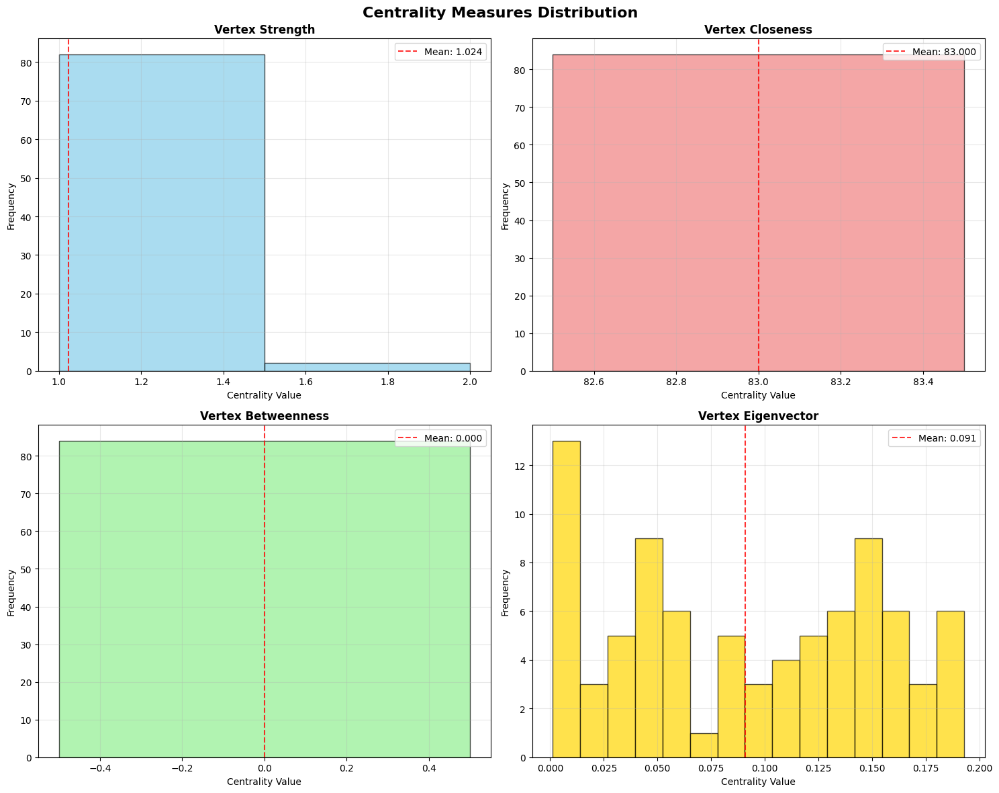

2. Plotting original network with centrality measures...


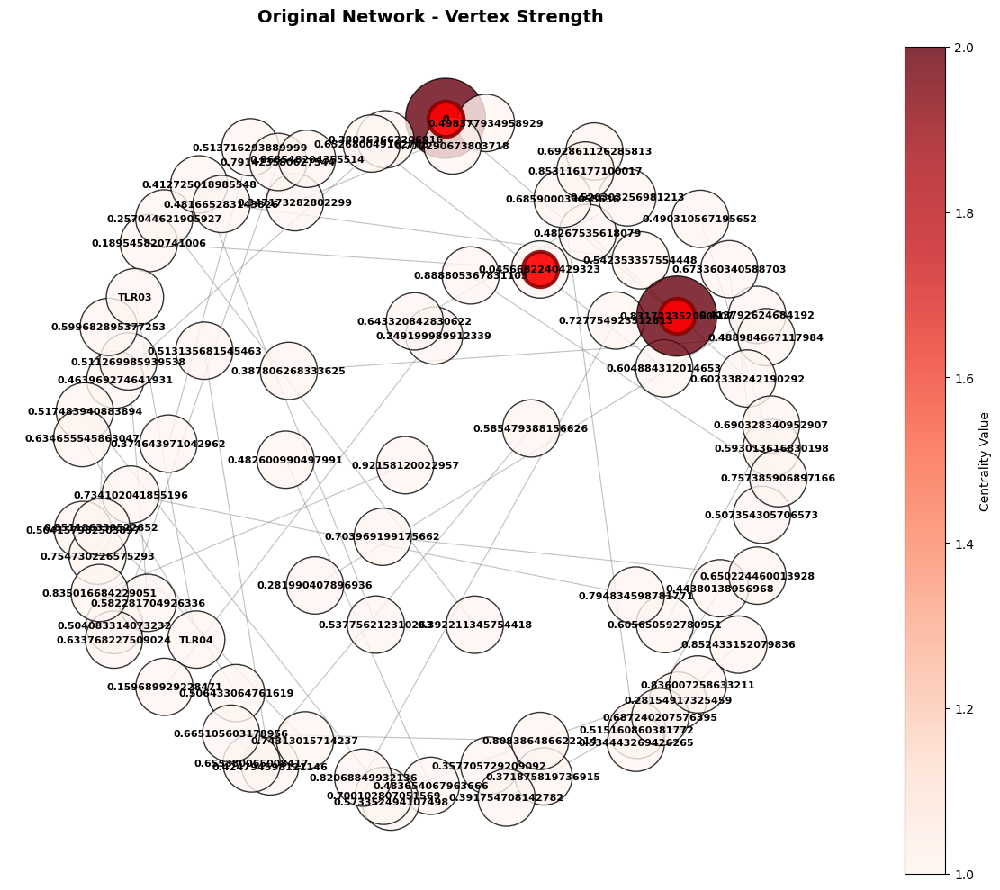

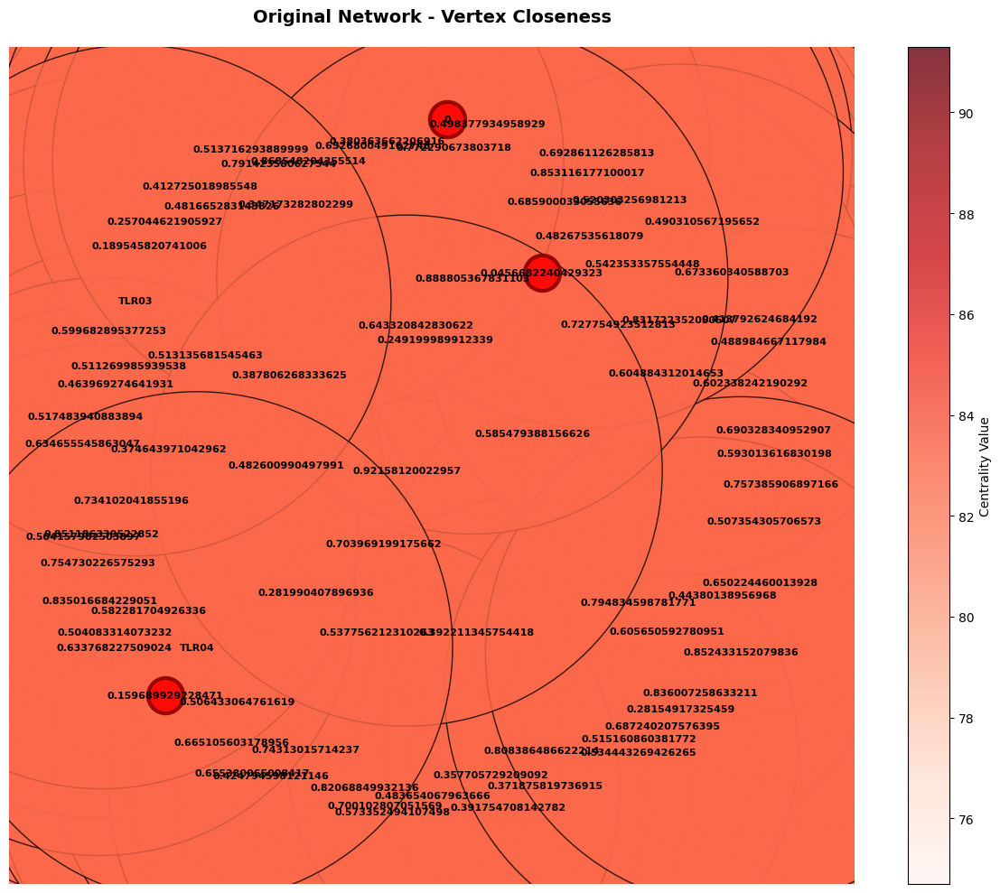

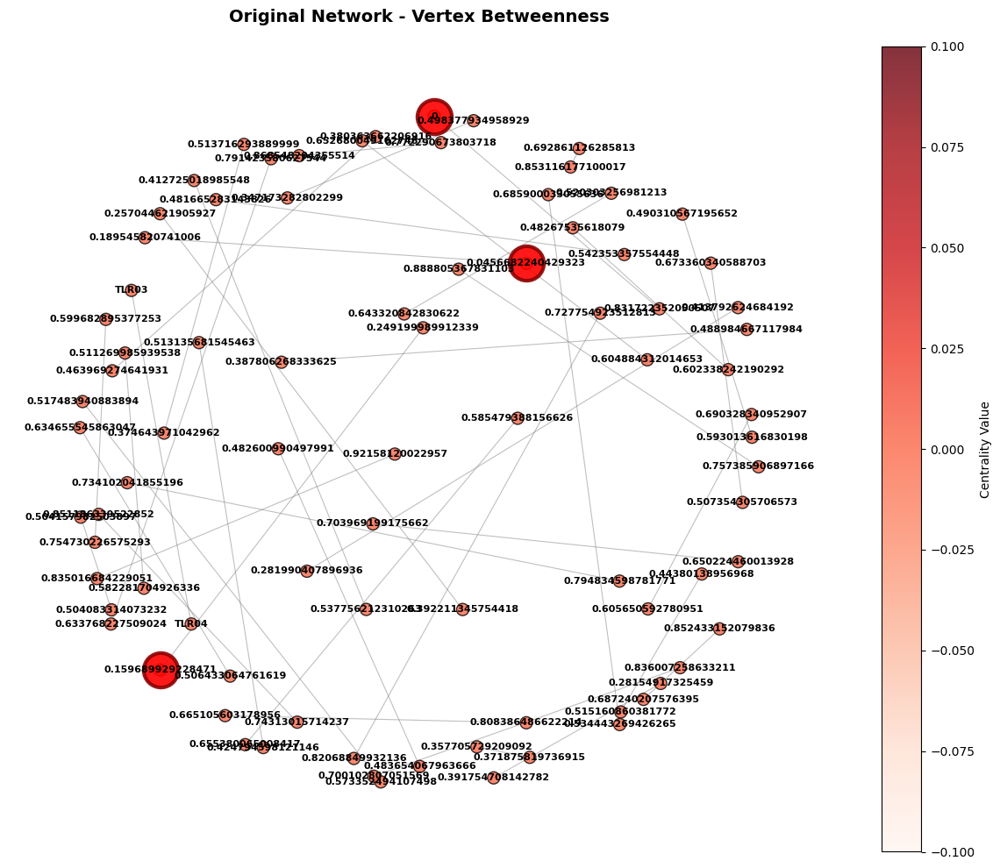

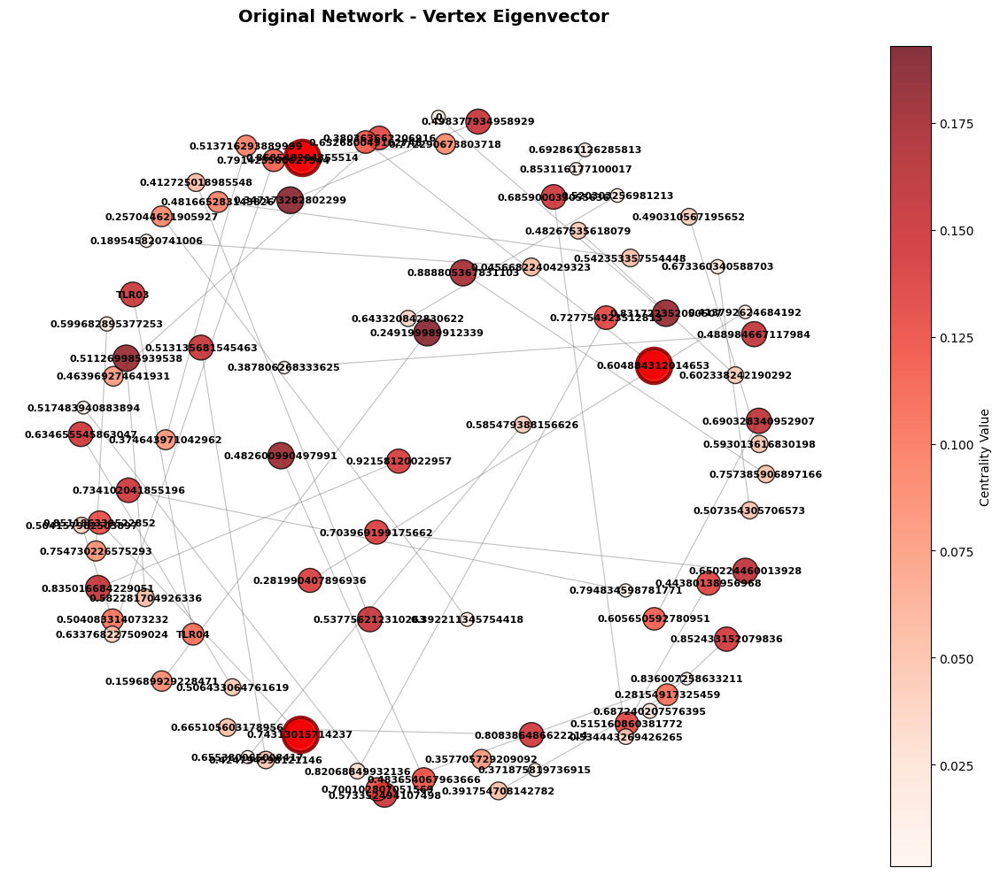

3. Plotting fragmentation process...


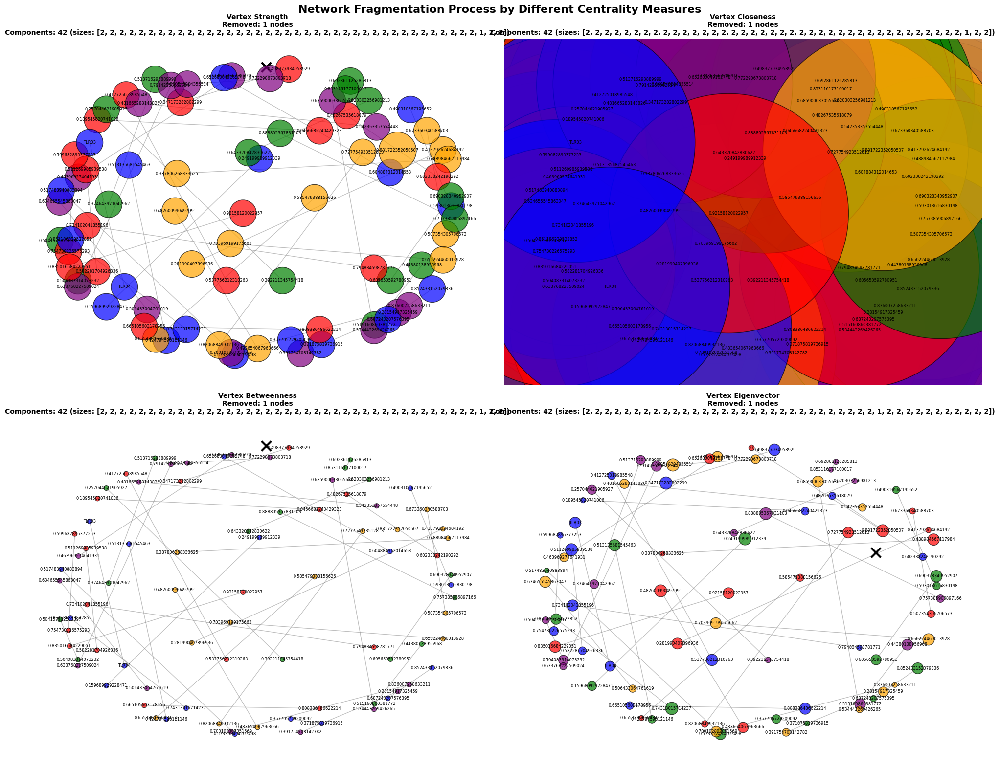

4. Plotting centrality comparison...


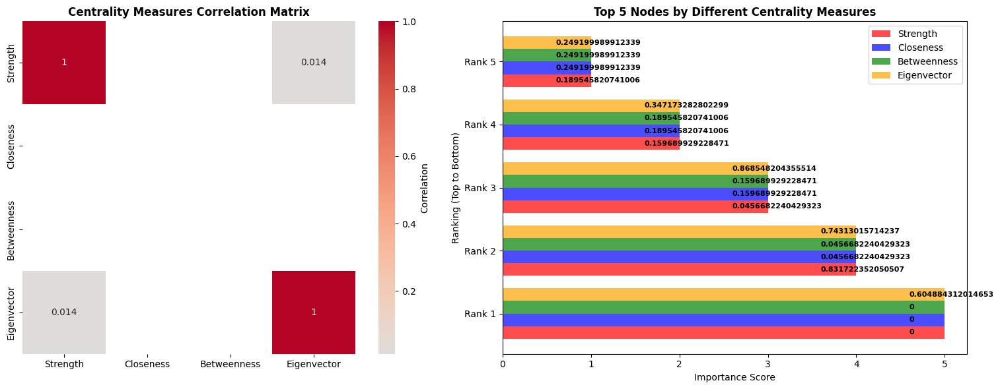

5. Plotting fragmentation efficiency...


<Figure size 1200x800 with 0 Axes>

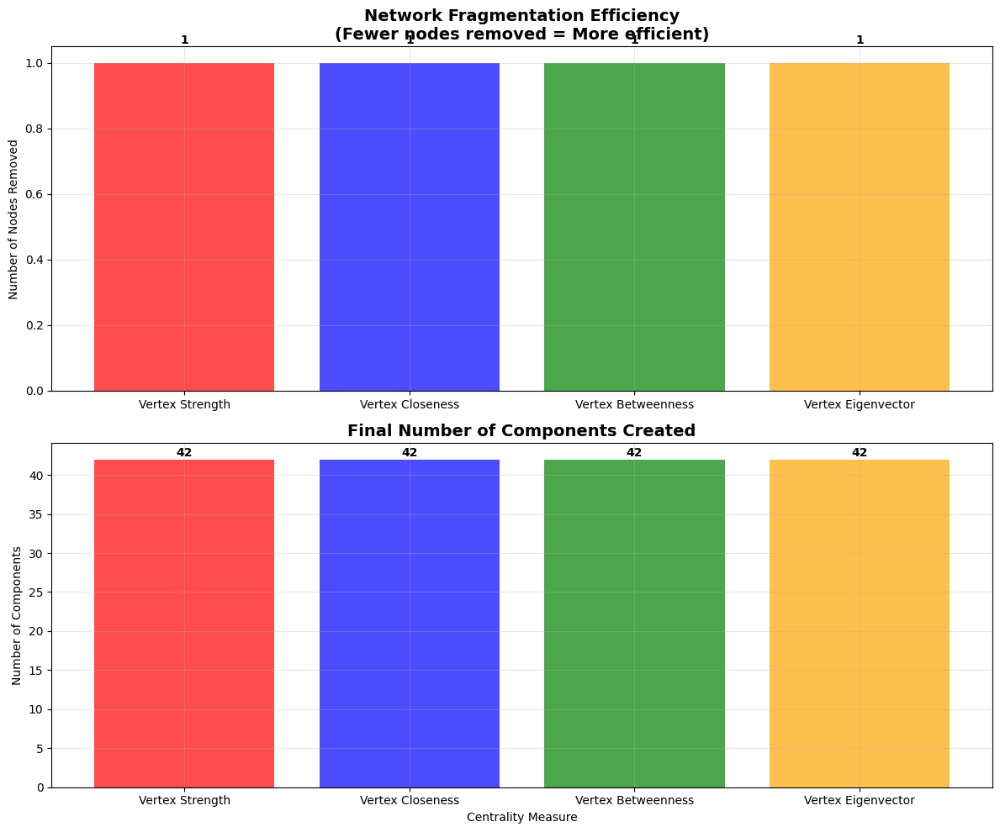

All visualizations completed!


In [140]:
# Then run the analysis:
results = safe_run_analysis('mtl-183-30.xlsx')